<a href="https://colab.research.google.com/github/swoo-nam/first-repo/blob/master/ver7_electric_power_pred_1_100.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !pip install sktime
# !pip install eli5
# !pip install joblib
# !pip install shap

In [ ]:
# !pip install flaml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 4.2 MB/s eta 0:00:00


In [ ]:
# 건물별 피쳐중요도 관련
from eli5.lightgbm import *
from eli5.sklearn import *
import eli5
import joblib
import shap
import lightgbm as lgb

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
import random
import os

DATA_PATH = "/content/drive/MyDrive/project/data/"
SEED = 42

In [ ]:
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import sktime
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
import matplotlib.pyplot as plt
from sklearn.metrics import make_scorer
from lightgbm import early_stopping
import xgboost as xgb
from flaml import AutoML

In [ ]:
def _smape(true, pred):
    true = np.array(true)
    pred = np.array(pred)
    v = 2 * np.abs(pred - true) / (np.abs(pred) + np.abs(true))
    output = np.mean(v) * 100
    return output
smape = make_scorer(_smape, greater_is_better=False)

In [ ]:
def lightgbm_smape(y_true, y_pred):
    smape_val = _smape(y_true, y_pred)
    return 'SMAPE', smape_val, False

In [ ]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(SEED) # Seed 고정

# 피쳐 불러오기

In [ ]:
# 필요한 피쳐 살리기 위해 다시 불러오기
train = pd.read_csv(f"{DATA_PATH}train.csv")
test = pd.read_csv(f"{DATA_PATH}test.csv")

In [ ]:
train.head()

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh)
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


In [ ]:
train['일조(hr)'] = train['일조(hr)'].fillna(0)
train['date_time'] = pd.to_datetime(train['일시'])
train['hour'] = train['date_time'].dt.hour
train['weekday'] = train['date_time'].dt.weekday
train['date'] = train['date_time'].dt.date
train['day'] = train['date_time'].dt.day
train['month'] = train['date_time'].dt.month
train['weekend'] = train['weekday'].isin([5,6]).astype(int)

test['date_time'] = pd.to_datetime(test['일시'])
test['hour'] = test['date_time'].dt.hour
test['weekday'] = test['date_time'].dt.weekday
test['date'] = test['date_time'].dt.date
test['day'] = test['date_time'].dt.day
test['month'] = test['date_time'].dt.month
test['weekend'] = test['weekday'].isin([5,6]).astype(int)

In [ ]:
train = train.merge(train.groupby(['건물번호','date'])['기온(C)'].min().reset_index().rename(columns = {'기온(C)':'min_temperature'}), on = ['건물번호','date'], how = 'left')
test = test.merge(test.groupby(['건물번호','date'])['기온(C)'].min().reset_index().rename(columns = {'기온(C)':'min_temperature'}), on = ['건물번호','date'], how = 'left')
mask = (train['hour'] >= 7) & (train['hour'] <= 20) & (train['weekday'].isin([0,1,2,3,4]))
train['working_hour'] = np.where(mask, 1, 0)
mask = (test['hour'] >= 7) & (test['hour'] <= 20) & (test['weekday'].isin([0,1,2,3,4]))
test['working_hour'] = np.where(mask, 1, 0)

In [ ]:
train = train[~((train['day'] == 1) & (train['month'] == 6))]
train

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh),date_time,hour,weekday,date,day,month,weekend,min_temperature,working_hour
24,1_20220602 00,1,20220602 00,18.1,NaN,0.4,67.0,0.0,NaN,1034.40,2022-06-02 00:00:00,0,3,2022-06-02,2,6,0,17.2,0
25,1_20220602 01,1,20220602 01,17.6,NaN,0.8,69.0,0.0,NaN,973.92,2022-06-02 01:00:00,1,3,2022-06-02,2,6,0,17.2,0
26,1_20220602 02,1,20220602 02,17.2,NaN,0.7,71.0,0.0,NaN,909.12,2022-06-02 02:00:00,2,3,2022-06-02,2,6,0,17.2,0
27,1_20220602 03,1,20220602 03,17.2,NaN,2.2,75.0,0.0,NaN,893.28,2022-06-02 03:00:00,3,3,2022-06-02,2,6,0,17.2,0
28,1_20220602 04,1,20220602 04,17.2,NaN,2.0,81.0,0.0,NaN,924.00,2022-06-02 04:00:00,4,3,2022-06-02,2,6,0,17.2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100_20220824 19,100,20220824 19,23.1,NaN,0.9,86.0,0.5,NaN,881.04,2022-08-24 19:00:00,19,2,2022-08-24,24,8,0,20.7,1
203996,100_20220824 20,100,20220824 20,22.4,NaN,1.3,86.0,0.0,NaN,798.96,2022-08-24 20:00:00,20,2,2022-08-24,24,8,0,20.7,1
203997,100_20220824 21,100,20220824 21,21.3,NaN,1.0,92.0,0.0,NaN,825.12,2022-08-24 21:00:00,21,2,2022-08-24,24,8,0,20.7,0
203998,100_20220824 22,100,20220824 22,21.0,NaN,0.3,94.0,0.0,NaN,640.08,2022-08-24 22:00:00,22,2,2022-08-24,24,8,0,20.7,0


In [ ]:
train_df = pd.read_csv(f"{DATA_PATH}train_ver15.csv")
test_df = pd.read_csv(f"{DATA_PATH}test_ver15.csv")

In [ ]:
train_df.head()

,power,building_num,date_time,time,day,month,week,day_of_year,sin_time,cos_time,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1034.40,1,20220602 00,0,3,6,22,153,0.000000,1.000000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1627.80,327.61,0.069171,0.021710
1,973.92,1,20220602 01,1,3,6,22,153,0.258819,0.965926,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1550.08,309.76,0.072765,0.023154
2,909.12,1,20220602 02,2,3,6,22,153,0.500000,0.866025,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1431.12,295.84,0.071155,0.025346
3,893.28,1,20220602 03,3,3,6,22,153,0.707107,0.707107,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1372.20,295.84,0.067707,0.030905
4,924.00,1,20220602 04,4,3,6,22,153,0.866025,0.500000,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1381.72,295.84,0.063264,0.033128


In [ ]:
test_df.head()

,building_num,date_time,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1,20220825 00,0,3,8,34,237,0.000000,1.000000,25.600000,...,65.333333,24.896022,2.161533,67.049625,74.251413,31.683443,1627.80,552.25,0.069171,0.021710
1,1,20220825 01,1,3,8,34,237,0.258819,0.965926,25.216667,...,66.250000,24.604326,1.967451,67.811221,73.790731,31.240887,1550.08,529.00,0.072765,0.023154
2,1,20220825 02,2,3,8,34,237,0.500000,0.866025,24.850000,...,67.333333,24.311353,1.895535,68.917187,73.364843,30.821889,1431.12,515.29,0.071155,0.025346
3,1,20220825 03,3,3,8,34,237,0.707107,0.707107,24.475000,...,68.416667,23.971145,1.803915,70.314543,72.918696,30.391003,1372.20,488.41,0.067707,0.030905
4,1,20220825 04,4,3,8,34,237,0.866025,0.500000,24.100000,...,69.500000,23.637122,1.680235,71.343075,72.464505,29.958487,1381.72,475.24,0.063264,0.033128


### 피쳐 드랍

In [ ]:
# 기본
train_df = train_df.drop(columns=['date_time'])
test_df = test_df.drop(columns=['date_time'])

In [ ]:
# # ver5-22 : TWH(기온, 풍속, 습도) 관련 피쳐 드랍
# train_df = train_df.drop(columns=['THI','CDH','feels_temp','TH_RM_mean','periodic_avg_7temp_change_rate','periodic_avg_7hum_RM_change_rate','periodic_avg_7THI_change_rate','periodic_avg_7feels_temp_change_rate','day_hour_THI'])
# test_df = test_df.drop(columns=['THI','CDH','feels_temp','TH_RM_mean','periodic_avg_7temp_change_rate','periodic_avg_7hum_RM_change_rate','periodic_avg_7THI_change_rate','periodic_avg_7feels_temp_change_rate','day_hour_THI'])

In [ ]:
# # ver5-23 : 전력 관련 피쳐 드랍
# train_df = train_df.drop(columns=['week_scaled','week_8std','day_hour_mean','periodic_avg_7power_change_rate','periodic_avg_1power_change_rate'])
# test_df = test_df.drop(columns=['week_scaled','week_8std','day_hour_mean','periodic_avg_7power_change_rate','periodic_avg_1power_change_rate'])

In [ ]:
train_df.shape , test_df.shape

((201600, 21), (16800, 20))

In [ ]:
# 자동 변수 생성
for i in range(1, 101):
    globals()[f'train_df_{i}'] = train_df[train_df['building_num'] == i].reset_index(drop=True)
    globals()[f'test_df_{i}'] = test_df[test_df['building_num'] == i].reset_index(drop=True)

In [ ]:
# 변수 리스트 생성
train_list = []
test_list = []
for i in globals():
    if i.startswith('train_df_'):
        train_list.append(i)
    elif i.startswith('test_df_'):
        test_list.append(i)
    else:
        pass

In [ ]:
len(train_list) , len(test_list)

(101, 100)

In [ ]:
# 데이터셋 만들기(마지막 7일간의 데이터를 검증데이터셋으로 사용)
def make_dataset(train_df, test_df):
    train_x = train_df.iloc[:, 2:]
    train_y = train_df['power']

    test_x = test_df.iloc[:, 1:]
    return train_x, train_y, test_x

def train_test_split(train_x, train_y, test_size=168):
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = test_size)
    return x_train, y_train, x_valid, y_valid


In [ ]:
# n_fold로 데이터셋 나누기
def n_fold_train_test_split(train_x, train_y, n, test_size=168, week=12):
    x_valid = train_x[test_size * (week-n-1):test_size * (week-n)]
    y_valid = train_y[test_size * (week-n-1):test_size * (week-n)]
    x_train = train_x.drop(index = list(x_valid.index))
    y_train = train_y.drop(index = list(y_valid.index))
    return x_train, y_train, x_valid, y_valid

In [ ]:
def train_test_split(train_x, train_y, test_size=168):
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = test_size)
    return x_train, y_train, x_valid, y_valid

In [ ]:
# LGBMRegressor 모델
def lgbm_predict(model, x_train, y_train, x_valid, y_valid, stopping=300, eval_metric=lightgbm_smape):
    model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], callbacks = [early_stopping(stopping)], eval_metric=eval_metric)
    pred = model.predict(x_valid)
    pred = pd.Series(pred)
    pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
    plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])
    smape_score = _smape(y_valid, pred)
    print(f"SMAPE_SCORE : {smape_score}")
    return smape_score

# test dataset 예측
def lgbm_test_predict(model, train_x, train_y, test_x):
    model.fit(train_x, train_y)
    lgbm_pred = model.predict(test_x)
    return lgbm_pred

In [ ]:
# XGBoost 모델
def xgb_smape(preds, dtrain):
    labels = dtrain.get_label()
    return 'xgb_smape', np.mean((np.abs(labels-preds))/(np.abs(labels) + np.abs(preds)))*100

def xgb_predict(model, x_train, y_train, x_valid, y_valid, stopping=300, eval_metric=xgb_smape):
    model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], early_stopping_rounds=stopping, eval_metric=xgb_smape)
    pred = model.predict(x_valid)
    pred = pd.Series(pred)
    pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
    fig, ax = plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])
    smape_score = _smape(y_valid, pred)
    print(f"SMAPE_SCORE : {smape_score}")
    return smape_score

def xgb_test_predict(model, train_x, train_y, test_x):
    model.fit(train_x, train_y)
    xgb_pred = model.predict(test_x)
    return xgb_pred

# 건물별



---
### 1번 건물


In [ ]:
train_df_1

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1034.40,1,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1627.80,327.61,0.069171,0.021710
1,973.92,1,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1550.08,309.76,0.072765,0.023154
2,909.12,1,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1431.12,295.84,0.071155,0.025346
3,893.28,1,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1372.20,295.84,0.067707,0.030905
4,924.00,1,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1381.72,295.84,0.063264,0.033128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011,2517.12,1,19,2,8,34,236,-0.965926,0.258819,26.258333,...,63.333333,25.966948,2.497465,63.860630,74.976558,32.426683,2629.80,650.25,0.028270,0.005351
2012,2208.96,1,20,2,8,34,236,-0.866025,0.500000,26.358333,...,63.333333,25.818187,2.513240,64.189764,75.120258,32.548721,2444.12,625.00,0.029337,0.006077
2013,1806.24,1,21,2,8,34,236,-0.707107,0.707107,26.350000,...,63.416667,25.630774,2.326587,64.622108,75.118105,32.541195,1924.08,605.16,0.019653,0.004192
2014,1387.20,1,22,2,8,34,236,-0.500000,0.866025,26.191667,...,63.833333,25.395270,2.291728,65.449476,74.938907,32.361014,1432.64,580.81,0.010639,0.004492


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_1['weekend'] = train_df_1['day'].isin([6]) + 0
test_df_1['weekend'] = test_df_1['day'].isin([6]) + 0

In [ ]:
# day_of_year, time 삭제
train_df_1 = train_df_1.drop(columns=['day_of_year','time'])
test_df_1 = test_df_1.drop(columns=['day_of_year','time'])



---
### 2번 건물


In [ ]:
train_df_2.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1131.84,2,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1242.45,327.61,0.014309,0.014812
1,1127.16,2,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1236.18,309.76,0.013175,0.014339
2,1118.16,2,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1227.81,295.84,0.012650,0.013299
3,1070.64,2,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1205.67,295.84,0.016519,0.015267
4,1067.76,2,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1196.07,295.84,0.015238,0.016583


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_2['weekend'] = train_df_2['day'].isin([0]) + 0
test_df_2['weekend'] = test_df_2['day'].isin([0]) + 0

In [ ]:
train_df_2 = train_df_2.drop(columns=['day_of_year', 'time'])
test_df_2 = test_df_2.drop(columns=['day_of_year', 'time'])



---
### 3번 건물


In [ ]:
train_df_3.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,857.52,3,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,980.445,327.61,0.029043,0.017978
1,825.48,3,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,939.060,309.76,0.026435,0.016252
2,821.52,3,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,913.440,295.84,0.024401,0.014651
3,817.56,3,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,879.000,295.84,0.019016,0.011679
4,772.56,3,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,847.305,295.84,0.022220,0.012240


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_3['weekend'] = train_df_3['day'].isin([0]) + 0
test_df_3['weekend'] = test_df_3['day'].isin([0]) + 0

In [ ]:
train_df_3 = train_df_3.drop(columns=['day_of_year', 'time'])
test_df_3 = test_df_3.drop(columns=['day_of_year', 'time'])



---

### 4번 건물

In [ ]:
train_df_4.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,690.48,4,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,710.985,327.61,0.009616,0.002734
1,658.44,4,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,711.480,309.76,0.011930,0.002923
2,655.38,4,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,719.250,295.84,0.013927,0.003521
3,660.60,4,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,719.115,295.84,0.015327,0.003273
4,683.46,4,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,719.715,295.84,0.016118,0.003409


In [ ]:
train_df_4 = train_df_4.drop(columns=['day_of_year', 'time'])
test_df_4 = test_df_4.drop(columns=['day_of_year', 'time'])



---
### 5번 건물


In [ ]:
train_df_5.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1565.28,5,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1788.63,327.61,0.025829,0.007923
1,1595.52,5,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1793.88,309.76,0.023555,0.008140
2,1581.84,5,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1794.48,295.84,0.021470,0.008173
3,1584.72,5,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1802.13,295.84,0.020163,0.007947
4,1610.64,5,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1817.55,295.84,0.019434,0.008218


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_5['weekend'] = train_df_5['day'].isin([0, 1, 2, 3]) + 0
test_df_5['weekend'] = test_df_5['day'].isin([0, 1, 2, 3]) + 0

In [ ]:
train_df_5 = train_df_5.drop(columns=['day_of_year', 'time'])
test_df_5 = test_df_5.drop(columns=['day_of_year', 'time'])



---
### 6번 건물


In [ ]:
train_df_6.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,971.52,6,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,1170.68,268.96,0.031915,0.005300
1,899.52,6,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,1017.88,234.09,0.028250,0.003550
2,879.84,6,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,984.52,204.49,0.020644,0.003035
3,860.64,6,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,978.92,193.21,0.022011,0.002951
4,842.88,6,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,961.32,225.00,0.022767,0.003109


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_6['weekend'] = 0
test_df_6['weekend'] = 0

mask_train = (train_df_6['day_of_year'] == 163) | (train_df_6['day_of_year'] == 177)| (train_df_6['day_of_year'] == 191)| (train_df_6['day_of_year'] == 205)| (train_df_6['day_of_year'] == 226)
train_df_6.loc[mask_train, 'weekend'] = 1

mask_test = test_df_6['day_of_year'] == 240
test_df_6.loc[mask_test, 'weekend'] = 1


In [ ]:
train_df_6 = train_df_6.drop(columns=['day_of_year', 'time'])
test_df_6 = test_df_6.drop(columns=['day_of_year', 'time'])



---
### 7번 건물


In [ ]:
train_df_7.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,552.72,7,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,441.34,268.96,-0.035765,-0.001165
1,548.64,7,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,432.90,234.09,-0.029071,-0.001125
2,522.96,7,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,430.98,204.49,-0.030634,-0.000419
3,518.88,7,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,419.94,193.21,-0.029819,-0.000018
4,536.16,7,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,419.94,225.00,-0.032681,-0.000210


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_7['weekend'] = train_df_7['day'].isin([5, 6]) + 0

test_df_7['weekend'] = test_df_7['day'].isin([5, 6]) + 0

In [ ]:
train_df_7 = train_df_7.drop(columns=['day_of_year', 'time'])
test_df_7 = test_df_7.drop(columns=['day_of_year', 'time'])



---
### 8번 건물


In [ ]:
train_df_8.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1181.76,8,0,3,6,22,153,0.000000,1.000000,24.833333,...,30.500000,21.890597,1.331618,38.679402,69.551925,28.889247,1364.62,299.29,0.016835,0.010213
1,1101.84,8,1,3,6,22,153,0.258819,0.965926,23.725000,...,33.833333,21.015120,1.372908,42.267186,68.625772,27.895616,1269.64,262.44,0.016440,0.007339
2,1086.72,8,2,3,6,22,153,0.500000,0.866025,22.491667,...,37.833333,20.089717,1.269383,46.072234,67.532337,26.736158,1230.26,225.00,0.019114,0.009737
3,1144.56,8,3,3,6,22,153,0.707107,0.707107,21.000000,...,42.333333,18.968222,1.135632,50.522660,66.057433,25.226360,1303.24,163.84,0.019371,0.014237
4,1200.48,8,4,3,6,22,153,0.866025,0.500000,19.616667,...,46.750000,18.126957,1.160919,54.442251,64.583334,23.773978,1378.42,182.25,0.016390,0.019411


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_8['weekend'] = train_df_8['day'].isin([6]) + 0

test_df_8['weekend'] = test_df_8['day'].isin([6]) + 0

In [ ]:
train_df_8 = train_df_8.drop(columns=['day_of_year', 'time'])
test_df_8 = test_df_8.drop(columns=['day_of_year', 'time'])



---
### 9번 건물


In [ ]:
train_df_9.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1280.16,9,0,3,6,22,153,0.000000,1.000000,25.033333,...,45.333333,22.955374,2.380201,53.487370,71.329293,30.203506,1506.64,404.01,0.026457,0.003606
1,1060.80,9,1,3,6,22,153,0.258819,0.965926,24.008333,...,50.083333,22.269932,2.321708,57.104697,70.488765,29.202712,1289.76,342.25,0.024841,0.004616
2,996.48,9,2,3,6,22,153,0.500000,0.866025,23.000000,...,54.750000,21.643789,2.210676,60.319359,69.567325,28.170186,1199.44,331.24,0.023742,0.003699
3,959.52,9,3,3,6,22,153,0.707107,0.707107,21.958333,...,59.833333,20.944744,2.101341,63.654842,68.537102,27.071542,1161.20,292.41,0.023434,0.003396
4,963.84,9,4,3,6,22,153,0.866025,0.500000,20.925000,...,64.750000,20.337860,2.054981,66.323328,67.403448,25.943193,1156.40,289.00,0.023972,0.003370


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_9['weekend'] = 0
test_df_9['weekend'] = 0

mask_train = (train_df_9['day_of_year'] == 163) | (train_df_9['day_of_year'] == 177)| (train_df_9['day_of_year'] == 191)| (train_df_9['day_of_year'] == 205)| (train_df_9['day_of_year'] == 226)
train_df_9.loc[mask_train, 'weekend'] = 1

mask_test = test_df_9['day_of_year'] == 240
test_df_9.loc[mask_test, 'weekend'] = 1


In [ ]:
train_df_9 = train_df_9.drop(columns=['day_of_year', 'time'])
test_df_9 = test_df_9.drop(columns=['day_of_year', 'time'])



---
### 10번 건물


In [ ]:
train_df_10.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,4047.84,10,0,3,6,22,153,0.000000,1.000000,22.433333,...,54.833333,21.460477,3.863381,58.562774,68.807768,27.485836,4296.20,372.49,0.016795,0.001820
1,3996.00,10,1,3,6,22,153,0.258819,0.965926,21.975000,...,58.500000,21.112711,3.945938,62.168501,68.461071,27.050955,4289.04,368.64,0.017391,0.002184
2,3995.04,10,2,3,6,22,153,0.500000,0.866025,21.475000,...,62.500000,20.803063,4.154255,65.373347,68.044906,26.557665,4219.12,364.81,0.016891,0.001925
3,4024.32,10,3,3,6,22,153,0.707107,0.707107,20.925000,...,66.833333,20.510284,4.068985,68.392832,67.537110,25.994202,4193.12,357.21,0.012399,0.002120
4,4025.76,10,4,3,6,22,153,0.866025,0.500000,20.475000,...,70.166667,20.201010,3.766064,71.101627,67.073875,25.516118,4190.40,342.25,0.010713,0.002284


In [ ]:
train_df_10 = train_df_10.drop(columns=['day_of_year', 'time'])
test_df_10 = test_df_10.drop(columns=['day_of_year', 'time'])



---
### 11번 건물


In [ ]:
train_df_11.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1460.40,11,0,3,6,22,153,0.000000,1.000000,24.833333,...,30.500000,21.890597,1.331618,38.679402,69.551925,28.889247,1726.74,299.29,0.014628,0.003232
1,1519.68,11,1,3,6,22,153,0.258819,0.965926,23.725000,...,33.833333,21.015120,1.372908,42.267186,68.625772,27.895616,1793.50,262.44,0.013446,0.004258
2,1390.80,11,2,3,6,22,153,0.500000,0.866025,22.491667,...,37.833333,20.089717,1.269383,46.072234,67.532337,26.736158,1650.44,225.00,0.013499,0.006673
3,1324.08,11,3,3,6,22,153,0.707107,0.707107,21.000000,...,42.333333,18.968222,1.135632,50.522660,66.057433,25.226360,1625.72,163.84,0.019172,0.003753
4,1316.40,11,4,3,6,22,153,0.866025,0.500000,19.616667,...,46.750000,18.126957,1.160919,54.442251,64.583334,23.773978,1615.28,182.25,0.018096,0.004269


In [ ]:
train_df_11 = train_df_11.drop(columns=['day_of_year', 'time'])
test_df_11 = test_df_11.drop(columns=['day_of_year', 'time'])



---
### 12번 건물


In [ ]:
train_df_12.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,948.60,12,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,1149.975,268.96,0.025424,0.003196
1,949.32,12,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,1163.805,234.09,0.026207,0.003340
2,925.92,12,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,1139.760,204.49,0.026193,0.004115
3,980.10,12,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,1164.495,193.21,0.025613,0.003997
4,1016.64,12,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,1224.870,225.00,0.023205,0.005775


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_12['weekend'] = train_df_12['day'].isin([6]) + 0

test_df_12['weekend'] = test_df_12['day'].isin([6]) + 0

In [ ]:
train_df_12 = train_df_12.drop(columns=['day_of_year', 'time'])
test_df_12 = test_df_12.drop(columns=['day_of_year', 'time'])



---
### 13번 건물


In [ ]:
train_df_13.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,2556.96,13,0,3,6,22,153,0.000000,1.000000,22.433333,...,54.833333,21.460477,3.863381,58.562774,68.807768,27.485836,2740.04,372.49,0.009961,0.006044
1,2388.48,13,1,3,6,22,153,0.258819,0.965926,21.975000,...,58.500000,21.112711,3.945938,62.168501,68.461071,27.050955,2697.44,368.64,0.014672,0.007648
2,2425.92,13,2,3,6,22,153,0.500000,0.866025,21.475000,...,62.500000,20.803063,4.154255,65.373347,68.044906,26.557665,2680.92,364.81,0.010202,0.008548
3,2480.64,13,3,3,6,22,153,0.707107,0.707107,20.925000,...,66.833333,20.510284,4.068985,68.392832,67.537110,25.994202,2692.60,357.21,0.015144,0.008678
4,2553.60,13,4,3,6,22,153,0.866025,0.500000,20.475000,...,70.166667,20.201010,3.766064,71.101627,67.073875,25.516118,2691.96,342.25,0.006180,0.008082


In [ ]:
train_df_13 = train_df_13.drop(columns=['day_of_year', 'time'])
test_df_13 = test_df_13.drop(columns=['day_of_year', 'time'])



---
### 14번 건물


In [ ]:
train_df_14.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1389.12,14,0,3,6,22,153,0.000000,1.000000,21.158333,...,50.250000,19.824866,2.482974,58.168350,66.778242,25.771732,1700.72,299.29,0.077676,0.021563
1,2145.60,14,1,3,6,22,153,0.258819,0.965926,20.550000,...,55.000000,19.390272,2.331747,62.296296,66.269975,25.205370,2110.24,289.00,0.044225,0.044065
2,2198.88,14,2,3,6,22,153,0.500000,0.866025,19.866667,...,59.833333,18.991768,2.388402,65.943020,65.603853,24.518526,2219.20,282.24,0.073086,0.054656
3,1927.20,14,3,3,6,22,153,0.707107,0.707107,19.258333,...,64.666667,18.716112,2.467109,69.336401,64.981102,23.896773,2131.08,295.84,0.077394,0.058972
4,1958.88,14,4,3,6,22,153,0.866025,0.500000,18.683333,...,69.250000,18.421325,2.472169,72.515417,64.339576,23.289660,2073.40,282.24,0.068717,0.054654


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_14['weekend'] = train_df_14['day'].isin([5,6]) + 0

test_df_14['weekend'] = test_df_14['day'].isin([5,6]) + 0

In [ ]:
train_df_14 = train_df_14.drop(columns=['day_of_year', 'time'])
test_df_14 = test_df_14.drop(columns=['day_of_year', 'time'])



---
### 15번 건물


In [ ]:
train_df_15.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1608.12,15,0,3,6,22,153,0.000000,1.000000,27.775000,...,32.000000,25.453571,1.834755,38.680487,73.020870,32.458499,1961.05125,462.25,0.025140,0.007595
1,1741.50,15,1,3,6,22,153,0.258819,0.965926,27.075000,...,34.333333,24.814560,1.906331,41.652720,72.523876,31.861595,1974.92625,453.69,0.008438,0.005585
2,1707.84,15,2,3,6,22,153,0.500000,0.866025,26.150000,...,37.666667,24.104628,1.813050,44.936917,71.846502,31.045370,2057.32500,408.04,0.016948,0.007534
3,1632.69,15,3,3,6,22,153,0.707107,0.707107,25.083333,...,41.166667,23.411608,1.734119,47.715853,70.953379,30.021512,1985.55750,384.16,0.020631,0.008875
4,1515.60,15,4,3,6,22,153,0.866025,0.500000,23.975000,...,44.916667,22.655976,1.559639,50.682645,69.957750,28.914779,1836.85875,342.25,0.020497,0.011351


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_15['weekend'] = train_df_15['day'].isin([5,6]) + 0

test_df_15['weekend'] = test_df_15['day'].isin([5,6]) + 0

In [ ]:
train_df_15 = train_df_15.drop(columns=['day_of_year', 'time'])
test_df_15 = test_df_15.drop(columns=['day_of_year', 'time'])



---
### 16번 건물


In [ ]:
train_df_16.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1137.12,16,0,3,6,22,153,0.000000,1.000000,23.166667,...,53.000000,21.589395,1.835973,58.650172,69.641550,28.306381,1272.02,361.00,0.017743,0.003354
1,1102.56,16,1,3,6,22,153,0.258819,0.965926,22.325000,...,55.666667,21.098719,1.553516,59.319376,68.726224,27.383540,1252.84,338.56,0.021181,0.004880
2,1088.16,16,2,3,6,22,153,0.500000,0.866025,21.550000,...,59.083333,20.683531,1.314513,60.193318,67.911717,26.550947,1248.38,338.56,0.024649,0.004425
3,1105.92,16,3,3,6,22,153,0.707107,0.707107,20.791667,...,62.500000,20.255296,1.127665,61.394346,67.068594,25.721637,1244.52,320.41,0.019665,0.003688
4,1200.96,16,4,3,6,22,153,0.866025,0.500000,20.041667,...,65.833333,19.831404,0.954178,62.872139,66.181740,24.885793,1417.90,306.25,0.021115,0.007376


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_16['weekend'] = train_df_16['day'].isin([5, 6]) + 0

test_df_16['weekend'] = test_df_16['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_16['day_of_year'] == 157) | (train_df_16['day_of_year'] == 227)
train_df_16.loc[mask, 'weekend'] = 1

In [ ]:
train_df_16 = train_df_16.drop(columns=['day_of_year', 'time'])
test_df_16 = test_df_16.drop(columns=['day_of_year', 'time'])



---
### 17번 건물

In [ ]:
train_df_17.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,514.98,17,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,631.740,327.61,0.029349,0.009720
1,514.44,17,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,608.100,309.76,0.029558,0.009636
2,521.82,17,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,610.470,295.84,0.026269,0.009988
3,526.32,17,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,612.750,295.84,0.022546,0.010359
4,519.84,17,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,731.385,295.84,0.064956,0.052703


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_17['weekend'] = train_df_17['day'].isin([5, 6]) + 0

test_df_17['weekend'] = test_df_17['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_17['day_of_year'] == 157) | (train_df_17['day_of_year'] == 227)
train_df_17.loc[mask, 'weekend'] = 1

In [ ]:
train_df_17 = train_df_17.drop(columns=['day_of_year', 'time'])
test_df_17 = test_df_17.drop(columns=['day_of_year', 'time'])



---
### 18번 건물


In [ ]:
train_df_18.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,780.0,18,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,914.575,268.96,0.019438,0.005006
1,785.4,18,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,912.725,234.09,0.018444,0.003794
2,787.8,18,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,907.900,204.49,0.020153,0.003998
3,762.6,18,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,905.550,193.21,0.022287,0.003558
4,774.9,18,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,912.025,225.00,0.019978,0.003887


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_18['weekend'] = train_df_18['day'].isin([5, 6]) + 0

test_df_18['weekend'] = test_df_18['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_18['day_of_year'] == 157) | (train_df_18['day_of_year'] == 227)
train_df_18.loc[mask, 'weekend'] = 1

In [ ]:
train_df_18 = train_df_18.drop(columns=['day_of_year', 'time'])
test_df_18 = test_df_18.drop(columns=['day_of_year', 'time'])



---
### 19번 건물


In [ ]:
train_df_19.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,560.16,19,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,710.040,327.61,0.025822,0.009330
1,551.16,19,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,702.525,309.76,0.025808,0.009695
2,556.92,19,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,701.730,295.84,0.024164,0.009074
3,552.96,19,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,682.560,295.84,0.023047,0.008344
4,574.92,19,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,685.185,295.84,0.019013,0.006992


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_19['weekend'] = train_df_19['day'].isin([5, 6]) + 0

test_df_19['weekend'] = test_df_19['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_19['day_of_year'] == 157) | (train_df_19['day_of_year'] == 227)
train_df_19.loc[mask, 'weekend'] = 1

In [ ]:
train_df_19 = train_df_19.drop(columns=['day_of_year', 'time'])
test_df_19 = test_df_19.drop(columns=['day_of_year', 'time'])



---
### 20번 건물


In [ ]:
train_df_20.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,916.80,20,0,3,6,22,153,0.000000,1.000000,24.641667,...,25.750000,21.968257,1.604179,33.329856,68.859277,28.143854,1006.56,268.96,0.011289,0.001952
1,908.64,20,1,3,6,22,153,0.258819,0.965926,23.583333,...,29.416667,21.019294,1.357382,37.586801,68.063973,27.334926,995.72,249.64,0.011020,0.001918
2,903.84,20,2,3,6,22,153,0.500000,0.866025,22.283333,...,33.750000,19.924018,1.256246,42.111909,66.968669,26.201676,989.28,193.21,0.010946,0.001964
3,904.32,20,3,3,6,22,153,0.707107,0.707107,21.091667,...,38.083333,19.151092,1.139901,46.402384,65.890419,25.097043,993.28,222.01,0.011284,0.001949
4,898.56,20,4,3,6,22,153,0.866025,0.500000,19.658333,...,43.166667,18.189386,1.102993,50.955864,64.451405,23.665984,988.60,166.41,0.011579,0.003844


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_20['weekend'] = train_df_20['day'].isin([5, 6]) + 0

test_df_20['weekend'] = test_df_20['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_20['day_of_year'] == 157) | (train_df_20['day_of_year'] == 227)
train_df_20.loc[mask, 'weekend'] = 1

In [ ]:
train_df_20 = train_df_20.drop(columns=['day_of_year', 'time'])
test_df_20 = test_df_20.drop(columns=['day_of_year', 'time'])



---
### 21번 건물


In [ ]:
train_df_21.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1578.105,21,0,3,6,22,153,0.000000,1.000000,24.516667,...,24.666667,22.051669,1.340670,30.622630,68.618137,27.863489,1668.975000,299.29,0.005788,0.014199
1,1573.755,21,1,3,6,22,153,0.258819,0.965926,23.666667,...,26.916667,21.243720,1.211336,32.834533,67.927492,27.166754,1664.003750,282.24,0.005211,0.013564
2,1574.965,21,2,3,6,22,153,0.500000,0.866025,22.658333,...,29.416667,20.421609,1.086515,35.321528,67.045340,26.265826,1657.124583,252.81,0.005236,0.013214
3,1197.440,21,3,3,6,22,153,0.707107,0.707107,21.533333,...,32.416667,19.618284,0.934744,38.041293,66.017002,25.221246,1565.286250,231.04,0.032957,0.017317
4,1213.360,21,4,3,6,22,153,0.866025,0.500000,20.391667,...,35.916667,18.815471,0.975552,41.111863,64.931934,24.134984,1419.059167,207.36,0.013354,0.011863


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_21['weekend'] = train_df_21['day'].isin([5, 6]) + 0

test_df_21['weekend'] = test_df_21['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_21['day_of_year'] == 157) | (train_df_21['day_of_year'] == 227)
train_df_21.loc[mask, 'weekend'] = 1

In [ ]:
train_df_21 = train_df_21.drop(columns=['day_of_year', 'time'])
test_df_21 = test_df_21.drop(columns=['day_of_year', 'time'])



---
### 22번 건물


In [ ]:
train_df_22.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,897.84,22,0,3,6,22,153,0.000000,1.000000,21.433333,...,57.666667,18.752717,1.247812,68.443063,67.650957,26.365152,953.46,190.44,0.011054,0.001439
1,890.28,22,1,3,6,22,153,0.258819,0.965926,20.291667,...,63.083333,17.883068,1.086610,72.836438,66.387986,25.124767,919.50,171.61,0.003860,0.000610
2,886.68,22,2,3,6,22,153,0.500000,0.866025,19.083333,...,68.583333,17.024135,0.934824,76.707755,64.907190,23.768636,914.67,151.29,0.002661,0.000712
3,886.68,22,3,3,6,22,153,0.707107,0.707107,17.933333,...,74.083333,16.328114,0.852543,80.137331,63.384838,22.454260,910.17,156.25,0.002414,0.000467
4,882.72,22,4,3,6,22,153,0.866025,0.500000,16.791667,...,79.000000,15.754558,0.721383,83.039280,61.737013,21.117101,914.70,158.76,0.002972,0.000500


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_22['weekend'] = train_df_22['day'].isin([5, 6]) + 0

test_df_22['weekend'] = test_df_22['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_22['day_of_year'] == 157) | (train_df_22['day_of_year'] == 227)
train_df_22.loc[mask, 'weekend'] = 1

In [ ]:
train_df_22 = train_df_22.drop(columns=['day_of_year', 'time'])
test_df_22 = test_df_22.drop(columns=['day_of_year', 'time'])



---
### 23번 건물


In [ ]:
train_df_23.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,982.8,23,0,3,6,22,153,0.000000,1.000000,24.325000,...,42.000000,21.910017,1.561230,48.940058,70.111585,29.170055,1047.575,334.89,0.006707,0.001133
1,984.0,23,1,3,6,22,153,0.258819,0.965926,23.266667,...,45.083333,21.200784,1.521041,51.410818,69.083578,28.075561,1044.650,299.29,0.006931,0.001026
2,990.3,23,2,3,6,22,153,0.500000,0.866025,22.133333,...,48.583333,20.477586,1.410111,53.963000,67.926163,26.878680,1043.225,272.25,0.005720,0.000961
3,1008.6,23,3,3,6,22,153,0.707107,0.707107,20.900000,...,52.250000,19.742573,1.362402,56.430231,66.568297,25.534857,1044.725,246.49,0.004243,0.000683
4,1012.2,23,4,3,6,22,153,0.866025,0.500000,19.775000,...,55.916667,19.012946,1.337417,58.979426,65.268612,24.292550,1047.150,225.00,0.004431,0.000636


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_23['weekend'] = train_df_23['day'].isin([5, 6]) + 0

test_df_23['weekend'] = test_df_23['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_23['day_of_year'] == 157) | (train_df_23['day_of_year'] == 227)
train_df_23.loc[mask, 'weekend'] = 1

In [ ]:
train_df_23 = train_df_23.drop(columns=['day_of_year', 'time'])
test_df_23 = test_df_23.drop(columns=['day_of_year', 'time'])



---
### 24번 건물


In [ ]:
train_df_24.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,6797.4,24,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,7788.900,327.61,0.013720,0.001833
1,6553.2,24,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,7504.725,309.76,0.013399,0.002168
2,6516.6,24,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,7387.075,295.84,0.014716,0.002123
3,6371.4,24,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,7291.275,295.84,0.017619,0.002172
4,6362.4,24,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,7261.450,295.84,0.015783,0.001983


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_24['weekend'] = train_df_24['day'].isin([5, 6]) + 0

test_df_24['weekend'] = test_df_24['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_24['day_of_year'] == 157) | (train_df_24['day_of_year'] == 227)
train_df_24.loc[mask, 'weekend'] = 1

In [ ]:
train_df_24 = train_df_24.drop(columns=['day_of_year', 'time'])
test_df_24 = test_df_24.drop(columns=['day_of_year', 'time'])



---
### 25번 건물


In [ ]:
train_df_25.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,5331.84,25,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,5367.700,327.61,0.004793,0.000351
1,5233.44,25,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,5251.865,309.76,0.004144,0.000249
2,4965.36,25,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,5152.280,295.84,0.006935,0.000806
3,4830.36,25,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,5083.615,295.84,0.009660,0.000932
4,4735.68,25,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,5019.385,295.84,0.010327,0.001140


In [ ]:
# 휴무일 지정(0: 영업일, 1: 휴무일)
train_df_25['weekend'] = (train_df_25['day'] == 0) + 0

test_df_25['weekend'] = (test_df_25['day'] == 0) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_25['day_of_year'] == 157) | (train_df_25['day_of_year'] == 227)
train_df_25.loc[mask, 'weekend'] = 1

In [ ]:
train_df_25 = train_df_25.drop(columns=['day_of_year', 'time'])
test_df_25 = test_df_25.drop(columns=['day_of_year', 'time'])



---
### 26번 건물


In [ ]:
train_df_26.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,2664.00,26,0,3,6,22,153,0.000000,1.000000,25.000000,...,33.583333,21.900426,1.510115,42.634149,70.059458,29.366672,2939.40,275.56,0.008377,0.001667
1,2526.72,26,1,3,6,22,153,0.258819,0.965926,24.008333,...,36.666667,20.915745,1.385482,45.921203,69.218442,28.445578,2821.84,240.25,0.009312,0.001734
2,2463.36,26,2,3,6,22,153,0.500000,0.866025,22.808333,...,40.666667,19.928707,1.233869,49.933326,68.142052,27.287110,2750.76,210.25,0.009808,0.001739
3,2443.20,26,3,3,6,22,153,0.707107,0.707107,21.475000,...,45.000000,18.924291,1.136351,53.789737,66.826863,25.925962,2713.64,179.56,0.010053,0.001669
4,2394.72,26,4,3,6,22,153,0.866025,0.500000,20.100000,...,49.583333,18.012861,1.053835,57.206701,65.357171,24.468645,2707.24,169.00,0.012696,0.001899


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_26['weekend'] = train_df_26['day'].isin([5, 6]) + 0

test_df_26['weekend'] = test_df_26['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_26['day_of_year'] == 157) | (train_df_26['day_of_year'] == 227)
train_df_26.loc[mask, 'weekend'] = 1

In [ ]:
train_df_26 = train_df_26.drop(columns=['day_of_year', 'time'])
test_df_26 = test_df_26.drop(columns=['day_of_year', 'time'])



---
### 27번 건물


In [ ]:
train_df_27.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,13067.6,27,0,3,6,22,153,0.000000,1.000000,26.375000,...,24.583333,23.667656,2.449508,31.365855,70.567349,29.963951,15523.783333,372.49,0.016981,0.002438
1,12731.6,27,1,3,6,22,153,0.258819,0.965926,25.466667,...,27.000000,22.918786,2.380353,33.463416,69.874240,29.239963,15150.683333,353.44,0.017387,0.002393
2,12451.6,27,2,3,6,22,153,0.500000,0.866025,24.333333,...,30.000000,22.085126,2.306453,36.161352,68.947000,28.260420,14787.850000,306.25,0.017105,0.002390
3,12252.8,27,3,3,6,22,153,0.707107,0.707107,23.175000,...,33.750000,21.287415,2.274691,39.982682,67.988847,27.245193,14556.266667,285.61,0.016523,0.002472
4,12042.8,27,4,3,6,22,153,0.866025,0.500000,21.975000,...,38.083333,20.550889,2.247815,44.293039,66.938958,26.141525,14385.816667,272.25,0.017150,0.002455


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_27['weekend'] = train_df_27['day'].isin([5, 6]) + 0

test_df_27['weekend'] = test_df_27['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_27['day_of_year'] == 157) | (train_df_27['day_of_year'] == 227)
train_df_27.loc[mask, 'weekend'] = 1

In [ ]:
train_df_27 = train_df_27.drop(columns=['day_of_year', 'time'])
test_df_27 = test_df_27.drop(columns=['day_of_year', 'time'])



---
### 28번 건물


In [ ]:
train_df_28.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1402.56,28,0,3,6,22,153,0.000000,1.000000,23.483333,...,47.833333,22.521230,1.842783,50.795674,69.601866,28.469129,1323.780,466.56,-0.006717,0.000412
1,1362.24,28,1,3,6,22,153,0.258819,0.965926,22.991667,...,49.916667,22.287194,1.743893,52.057878,69.147074,27.969869,1284.000,441.00,-0.005453,0.000528
2,1266.12,28,2,3,6,22,153,0.500000,0.866025,22.525000,...,52.166667,21.919934,1.875602,53.741281,68.718453,27.497788,1216.065,396.01,0.011099,0.002214
3,1233.36,28,3,3,6,22,153,0.707107,0.707107,21.891667,...,55.666667,21.316867,1.663971,56.550315,68.136414,26.857248,1205.655,324.00,-0.001206,0.000936
4,1208.16,28,4,3,6,22,153,0.866025,0.500000,21.316667,...,57.750000,20.960426,1.700283,58.004113,67.495521,26.225700,1182.495,361.00,-0.002527,0.000854


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_28['weekend'] = train_df_28['day'].isin([5, 6]) + 0

test_df_28['weekend'] = test_df_28['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_28['day_of_year'] == 157) | (train_df_28['day_of_year'] == 227)
train_df_28.loc[mask, 'weekend'] = 1

In [ ]:
train_df_28 = train_df_28.drop(columns=['day_of_year', 'time'])
test_df_28 = test_df_28.drop(columns=['day_of_year', 'time'])



---
### 29번 건물


In [ ]:
train_df_29.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1208.7,29,0,3,6,22,153,0.000000,1.000000,21.925000,...,50.658333,20.064181,2.879284,60.209219,67.810880,26.713436,1228.325,275.56,-0.000811,0.000648
1,1131.9,29,1,3,6,22,153,0.258819,0.965926,21.000000,...,55.075000,19.408153,2.682471,64.792416,66.884367,25.754376,1186.550,249.64,0.002275,0.001104
2,1076.7,29,2,3,6,22,153,0.500000,0.866025,20.083333,...,60.416667,18.883822,2.377476,68.978198,65.940260,24.799236,1158.550,256.00,0.005840,0.001299
3,1121.1,29,3,3,6,22,153,0.707107,0.707107,19.275000,...,65.583333,18.424773,2.273249,72.366168,65.049109,23.938499,1152.800,252.81,0.000049,0.000617
4,1036.8,29,4,3,6,22,153,0.866025,0.500000,18.508333,...,70.333333,17.959423,2.200441,75.386757,64.121436,23.095483,1145.700,237.16,0.008633,0.001839


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_29['weekend'] = train_df_29['day'].isin([5, 6]) + 0

test_df_29['weekend'] = test_df_29['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_29['day_of_year'] == 157) | (train_df_29['day_of_year'] == 227)
train_df_29.loc[mask, 'weekend'] = 1

In [ ]:
train_df_29 = train_df_29.drop(columns=['day_of_year', 'time'])
test_df_29 = test_df_29.drop(columns=['day_of_year', 'time'])



---
### 30번 건물


In [ ]:
train_df_30.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,726.3,30,0,3,6,22,153,0.000000,1.000000,24.275000,...,31.583333,20.804207,1.606012,40.266804,69.036519,28.343506,770.25,204.49,0.007861,0.001381
1,697.8,30,1,3,6,22,153,0.258819,0.965926,22.991667,...,35.000000,19.649714,1.482010,43.918065,67.884862,27.126931,755.00,176.89,0.009407,0.001656
2,678.6,30,2,3,6,22,153,0.500000,0.866025,21.583333,...,39.000000,18.642065,1.377085,47.161439,66.538825,25.734460,746.00,171.61,0.011340,0.001819
3,666.6,30,3,3,6,22,153,0.707107,0.707107,20.016667,...,43.416667,17.620209,1.165226,50.828910,64.908580,24.105961,736.70,144.00,0.010906,0.001928
4,657.3,30,4,3,6,22,153,0.866025,0.500000,18.416667,...,48.083333,16.617100,1.032114,54.701386,63.108377,22.382330,727.35,123.21,0.010444,0.001937


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_30['weekend'] = train_df_30['day'].isin([5, 6]) + 0

test_df_30['weekend'] = test_df_30['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_30['day_of_year'] == 157) | (train_df_30['day_of_year'] == 227)
train_df_30.loc[mask, 'weekend'] = 1

In [ ]:
train_df_30 = train_df_30.drop(columns=['day_of_year', 'time'])
test_df_30 = test_df_30.drop(columns=['day_of_year', 'time'])



---
### 31번 건물


In [ ]:
train_df_31.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1046.88,31,0,3,6,22,153,0.000000,1.000000,27.050000,...,24.833333,24.524490,1.620849,30.485958,71.309576,30.766778,1098.33,436.81,0.006206,0.000578
1,1029.24,31,1,3,6,22,153,0.258819,0.965926,26.191667,...,26.750000,23.705338,1.463795,32.257349,70.626208,30.040624,1075.77,368.64,0.003637,0.000302
2,1015.20,31,2,3,6,22,153,0.500000,0.866025,25.208333,...,29.083333,22.796824,1.315519,34.679296,69.817943,29.178087,1069.47,316.84,0.002082,0.000350
3,959.04,31,3,3,6,22,153,0.707107,0.707107,24.016667,...,31.750000,21.797313,1.205439,37.344019,68.762289,28.058014,1027.44,265.69,0.006461,0.001328
4,878.76,31,4,3,6,22,153,0.866025,0.500000,22.658333,...,34.916667,20.690034,1.050756,40.521863,67.492586,26.729431,970.62,213.16,0.010337,0.001727


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_31['weekend'] = train_df_31['day'].isin([5, 6]) + 0

test_df_31['weekend'] = test_df_31['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_31['day_of_year'] == 157) | (train_df_31['day_of_year'] == 227)
train_df_31.loc[mask, 'weekend'] = 1

In [ ]:
train_df_31 = train_df_31.drop(columns=['day_of_year', 'time'])
test_df_31 = test_df_31.drop(columns=['day_of_year', 'time'])



---
### 32번 건물


In [ ]:
train_df_32.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,9318.96,32,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,9835.02,327.61,0.005111,0.000463
1,9280.08,32,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,9813.90,309.76,0.005285,0.000595
2,9227.52,32,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,9781.20,295.84,0.005659,0.000601
3,9237.60,32,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,9761.94,295.84,0.005228,0.000514
4,9245.52,32,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,9735.36,295.84,0.004998,0.000474


In [ ]:
train_df_32 = train_df_32.drop(columns=['day_of_year', 'time'])
test_df_32 = test_df_32.drop(columns=['day_of_year', 'time'])



---
### 33번 건물


In [ ]:
train_df_33.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,8305.20,33,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,8666.52,327.61,0.004526,0.000572
1,8291.52,33,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,8642.70,309.76,0.004446,0.000567
2,8283.60,33,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,8610.78,295.84,0.004370,0.000537
3,8238.96,33,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,8584.20,295.84,0.004742,0.000565
4,8243.28,33,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,8560.98,295.84,0.004342,0.000523


In [ ]:
train_df_33 = train_df_33.drop(columns=['day_of_year', 'time'])
test_df_33 = test_df_33.drop(columns=['day_of_year', 'time'])



---
### 34번 건물


In [ ]:
train_df_34.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,3107.52,34,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,3308.250,327.61,0.005494,0.000739
1,3061.08,34,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,3294.270,309.76,0.006463,0.000910
2,3089.16,34,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,3281.745,295.84,0.005843,0.000756
3,3074.04,34,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,3266.490,295.84,0.005977,0.000708
4,3085.20,34,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,3254.160,295.84,0.005416,0.000705


In [ ]:
train_df_34 = train_df_34.drop(columns=['day_of_year', 'time'])
test_df_34 = test_df_34.drop(columns=['day_of_year', 'time'])



---
### 35번 건물


In [ ]:
train_df_35.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,2058.9,35,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,2151.575,327.61,0.004136,0.000387
1,2065.2,35,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,2154.650,309.76,0.003978,0.000406
2,2064.6,35,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,2146.775,295.84,0.003735,0.000337
3,2057.4,35,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,2140.125,295.84,0.004336,0.000384
4,2062.2,35,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,2132.850,295.84,0.003331,0.000317


In [ ]:
train_df_35 = train_df_35.drop(columns=['day_of_year', 'time'])
test_df_35 = test_df_35.drop(columns=['day_of_year', 'time'])



---
### 36번 건물


In [ ]:
train_df_36.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,2819.28,36,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,2858.76,268.96,0.001086,0.000235
1,2817.60,36,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,2856.30,234.09,0.001410,0.000162
2,2808.00,36,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,2848.48,204.49,0.001519,0.000194
3,2807.76,36,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,2844.42,193.21,0.001279,0.000215
4,2811.36,36,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,2839.80,225.00,0.000972,0.000186


In [ ]:
train_df_36 = train_df_36.drop(columns=['day_of_year', 'time'])
test_df_36 = test_df_36.drop(columns=['day_of_year', 'time'])



---
### 37번 건물 - 태양광


In [ ]:
train_df_37.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,970.8,37,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1123.850,327.61,0.024470,0.004924
1,960.0,37,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1090.000,309.76,0.018258,0.006159
2,977.4,37,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1079.675,295.84,0.016439,0.006942
3,922.8,37,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1061.025,295.84,0.018323,0.006541
4,874.8,37,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1022.900,295.84,0.020298,0.005543


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_37['closed'] = 0
mask = (train_df_37['day_of_year'] == 171) | (train_df_37['day_of_year'] == 192) | (train_df_37['day_of_year'] == 220)
train_df_37.loc[mask, 'closed'] = 1

test_df_37['closed'] = 0

In [ ]:
train_df_37 = train_df_37.drop(columns=['day_of_year', 'time'])
test_df_37 = test_df_37.drop(columns=['day_of_year', 'time'])



---
### 38번 건물


In [ ]:
train_df_38.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,515.16,38,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,569.13,327.61,0.007829,0.004281
1,508.68,38,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,566.46,309.76,0.007880,0.005751
2,514.44,38,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,566.01,295.84,0.008240,0.004991
3,489.96,38,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,526.05,295.84,0.008422,0.004541
4,455.40,38,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,494.37,295.84,0.010483,0.004993


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_38['closed'] = 0
mask = (train_df_38['day_of_year'] == 164) | (train_df_38['day_of_year'] == 206) | (train_df_38['day_of_year'] == 213)
train_df_38.loc[mask, 'closed'] = 1

test_df_38['closed'] = 0

In [ ]:
train_df_38 = train_df_38.drop(columns=['day_of_year', 'time'])
test_df_38 = test_df_38.drop(columns=['day_of_year', 'time'])



---
### 39번 건물


In [ ]:
train_df_39.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,514.56,39,0,3,6,22,153,0.000000,1.000000,26.375000,...,24.583333,23.667656,2.449508,31.365855,70.567349,29.963951,607.44,372.49,0.020224,0.007911
1,522.72,39,1,3,6,22,153,0.258819,0.965926,25.466667,...,27.000000,22.918786,2.380353,33.463416,69.874240,29.239963,609.68,353.44,0.016663,0.006623
2,497.76,39,2,3,6,22,153,0.500000,0.866025,24.333333,...,30.000000,22.085126,2.306453,36.161352,68.947000,28.260420,573.72,306.25,0.013042,0.006433
3,476.16,39,3,3,6,22,153,0.707107,0.707107,23.175000,...,33.750000,21.287415,2.274691,39.982682,67.988847,27.245193,566.20,285.61,0.015626,0.006789
4,512.16,39,4,3,6,22,153,0.866025,0.500000,21.975000,...,38.083333,20.550889,2.247815,44.293039,66.938958,26.141525,586.92,272.25,0.018552,0.005485


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_39['closed'] = 0
mask = (train_df_39['day_of_year'] == 199) | (train_df_39['day_of_year'] == 220)
train_df_39.loc[mask, 'closed'] = 1

test_df_39['closed'] = 0

In [ ]:
train_df_39 = train_df_39.drop(columns=['day_of_year', 'time'])
test_df_39 = test_df_39.drop(columns=['day_of_year', 'time'])



---

### 40번 건물

In [ ]:
train_df_40.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,359.4,40,0,3,6,22,153,0.000000,1.000000,25.908333,...,39.250000,23.270687,1.578266,48.879678,71.740331,30.873802,538.0000,361.00,0.088278,0.028525
1,346.8,40,1,3,6,22,153,0.258819,0.965926,24.941667,...,42.833333,22.567504,1.473918,50.744343,70.954097,29.953900,521.0000,349.69,0.103871,0.028074
2,429.3,40,2,3,6,22,153,0.500000,0.866025,23.750000,...,48.583333,21.849427,1.416392,55.706752,70.013240,28.824401,546.0875,320.41,0.065294,0.019296
3,402.3,40,3,3,6,22,153,0.707107,0.707107,22.541667,...,55.000000,21.057207,1.321562,61.751867,68.967688,27.623199,515.1375,278.89,0.049684,0.017665
4,357.0,40,4,3,6,22,153,0.866025,0.500000,21.341667,...,61.583333,20.386868,1.272091,67.174656,67.791814,26.369289,443.2875,278.89,0.051111,0.015471


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_40['closed'] = 0
mask = (train_df_40['day_of_year'] == 171) | (train_df_40['day_of_year'] == 199) | (train_df_40['day_of_year'] == 220)
train_df_40.loc[mask, 'closed'] = 1

test_df_40['closed'] = 0

In [ ]:
train_df_40 = train_df_40.drop(columns=['day_of_year', 'time'])
test_df_40 = test_df_40.drop(columns=['day_of_year', 'time'])



---
### 41번 건물


In [ ]:
train_df_41.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1226.4,41,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1537.450,327.61,0.052495,0.012846
1,1047.0,41,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1277.750,309.76,0.050310,0.012725
2,949.2,41,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1056.300,295.84,0.035174,0.008583
3,869.4,41,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,996.100,295.84,0.039573,0.008185
4,862.8,41,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,957.375,295.84,0.033306,0.006195


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_41['closed'] = 0
mask = (train_df_41['day_of_year'] == 178) | (train_df_41['day_of_year'] == 206) | (train_df_41['day_of_year'] == 220)
train_df_41.loc[mask, 'closed'] = 1

test_df_41['closed'] = 0

In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_41['weekend'] = train_df_41['day'].isin([5, 6]) + 0

test_df_41['weekend'] = test_df_41['day'].isin([5, 6]) + 0

In [ ]:
train_df_41 = train_df_41.drop(columns=['day_of_year', 'time'])
test_df_41 = test_df_41.drop(columns=['day_of_year', 'time'])



---
### 42번 건물


In [ ]:
train_df_42.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,363.60,42,0,3,6,22,153,0.000000,1.000000,22.933333,...,47.916667,21.599182,1.913968,54.039960,68.902917,27.811734,379.02,357.21,0.005363,0.002464
1,341.64,42,1,3,6,22,153,0.258819,0.965926,22.191667,...,52.166667,20.983923,1.696435,58.033813,68.276303,27.094635,370.02,309.76,0.006419,0.002500
2,354.96,42,2,3,6,22,153,0.500000,0.866025,21.425000,...,56.833333,20.401781,1.604675,61.874765,67.581860,26.328533,366.30,295.84,0.007147,0.001856
3,342.72,42,3,3,6,22,153,0.707107,0.707107,20.683333,...,61.500000,19.863046,1.496264,65.278647,66.852047,25.562193,362.43,285.61,0.007935,0.002130
4,383.40,42,4,3,6,22,153,0.866025,0.500000,20.025000,...,65.750000,19.407193,1.327608,68.005009,66.152773,24.863365,410.88,285.61,0.014577,0.004459


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_42['closed'] = 0
mask = (train_df_42['day_of_year'] == 164) | (train_df_42['day_of_year'] == 192) | (train_df_42['day_of_year'] == 234)
train_df_42.loc[mask, 'closed'] = 1

test_df_42['closed'] = 0

In [ ]:
train_df_42 = train_df_42.drop(columns=['day_of_year', 'time'])
test_df_42 = test_df_42.drop(columns=['day_of_year', 'time'])



---
### 43번 건물


In [ ]:
train_df_43.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,340.5,43,0,3,6,22,153,0.000000,1.000000,21.433333,...,57.666667,18.752717,1.247812,68.443063,67.650957,26.365152,436.625,190.44,0.041061,0.009551
1,334.8,43,1,3,6,22,153,0.258819,0.965926,20.291667,...,63.083333,17.883068,1.086610,72.836438,66.387986,25.124767,423.300,171.61,0.032262,0.010681
2,333.0,43,2,3,6,22,153,0.500000,0.866025,19.083333,...,68.583333,17.024135,0.934824,76.707755,64.907190,23.768636,413.275,151.29,0.023426,0.008055
3,336.6,43,3,3,6,22,153,0.707107,0.707107,17.933333,...,74.083333,16.328114,0.852543,80.137331,63.384838,22.454260,408.325,156.25,0.020916,0.011539
4,333.6,43,4,3,6,22,153,0.866025,0.500000,16.791667,...,79.000000,15.754558,0.721383,83.039280,61.737013,21.117101,406.700,158.76,0.020025,0.007115


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_43['weekend'] = train_df_43['day'].isin([5, 6]) + 0

test_df_43['weekend'] = test_df_43['day'].isin([5, 6]) + 0

In [ ]:
train_df_43 = train_df_43.drop(columns=['day_of_year', 'time'])
test_df_43 = test_df_43.drop(columns=['day_of_year', 'time'])



---
### 44번 건물


In [ ]:
train_df_44.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,480.00,44,0,3,6,22,153,0.000000,1.000000,21.433333,...,57.666667,18.752717,1.247812,68.443063,67.650957,26.365152,532.72,190.44,0.016792,0.003995
1,472.32,44,1,3,6,22,153,0.258819,0.965926,20.291667,...,63.083333,17.883068,1.086610,72.836438,66.387986,25.124767,516.96,171.61,0.010818,0.003722
2,475.68,44,2,3,6,22,153,0.500000,0.866025,19.083333,...,68.583333,17.024135,0.934824,76.707755,64.907190,23.768636,524.64,151.29,0.010304,0.003506
3,490.08,44,3,3,6,22,153,0.707107,0.707107,17.933333,...,74.083333,16.328114,0.852543,80.137331,63.384838,22.454260,523.64,156.25,0.005837,0.002949
4,478.56,44,4,3,6,22,153,0.866025,0.500000,16.791667,...,79.000000,15.754558,0.721383,83.039280,61.737013,21.117101,521.24,158.76,0.007646,0.003029


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_44['weekend'] = train_df_44['day'].isin([5, 6]) + 0

test_df_44['weekend'] = test_df_44['day'].isin([5, 6]) + 0

In [ ]:
train_df_44 = train_df_44.drop(columns=['day_of_year', 'time'])
test_df_44 = test_df_44.drop(columns=['day_of_year', 'time'])



---
### 45번 건물


In [ ]:
train_df_45.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1967.52,45,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,2347.08,327.61,0.022423,0.004932
1,1945.92,45,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,2347.56,309.76,0.026160,0.005352
2,1918.08,45,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,2324.88,295.84,0.025630,0.005576
3,1906.08,45,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,2302.52,295.84,0.023099,0.005132
4,1941.60,45,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,2375.88,295.84,0.025552,0.006059


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_45['weekend'] = train_df_45['day'].isin([5, 6]) + 0

test_df_45['weekend'] = test_df_45['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_45['day_of_year'] == 157) | (train_df_45['day_of_year'] == 227)
train_df_45.loc[mask, 'weekend'] = 1

In [ ]:
train_df_45 = train_df_45.drop(columns=['day_of_year', 'time'])
test_df_45 = test_df_45.drop(columns=['day_of_year', 'time'])



---
### 46번 건물 - 태양광

In [ ]:
train_df_46.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1182.96,46,0,3,6,22,153,0.000000,1.000000,26.458333,...,19.583333,24.050379,1.661786,24.169208,70.060443,29.245904,1533.86,400.00,0.028979,0.007495
1,1178.40,46,1,3,6,22,153,0.258819,0.965926,25.591667,...,21.583333,23.288782,1.575357,26.604714,69.411133,28.627977,1514.28,364.81,0.025542,0.007151
2,1186.32,46,2,3,6,22,153,0.500000,0.866025,24.625000,...,24.000000,22.567431,1.440687,28.973220,68.665150,27.897392,1694.28,345.96,0.047525,0.008100
3,1157.04,46,3,3,6,22,153,0.707107,0.707107,23.458333,...,26.833333,21.741672,1.372889,31.900417,67.695790,26.918677,1642.20,295.84,0.042242,0.007413
4,1167.60,46,4,3,6,22,153,0.866025,0.500000,22.316667,...,30.083333,21.073723,1.284752,35.454199,66.721045,25.932856,1462.44,302.76,0.024469,0.004839


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_46['weekend'] = train_df_46['day'].isin([5, 6]) + 0

test_df_46['weekend'] = test_df_46['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_46['day_of_year'] == 157) | (train_df_46['day_of_year'] == 227)
train_df_46.loc[mask, 'weekend'] = 1

In [ ]:
train_df_46 = train_df_46.drop(columns=['day_of_year', 'time'])
test_df_46 = test_df_46.drop(columns=['day_of_year', 'time'])



---
### 47번 건물


In [ ]:
train_df_47.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,3444.48,47,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,4400.06,268.96,0.017344,0.005217
1,3478.08,47,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,4364.88,234.09,0.015710,0.004894
2,3506.40,47,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,4330.16,204.49,0.014209,0.004426
3,3655.68,47,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,4338.86,193.21,0.010333,0.004054
4,3698.88,47,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,4351.12,225.00,0.009727,0.003360


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_47['weekend'] = train_df_47['day'].isin([5, 6]) + 0

test_df_47['weekend'] = test_df_47['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_47['day_of_year'] == 157) | (train_df_47['day_of_year'] == 227)
train_df_47.loc[mask, 'weekend'] = 1

In [ ]:
train_df_47 = train_df_47.drop(columns=['day_of_year', 'time'])
test_df_47 = test_df_47.drop(columns=['day_of_year', 'time'])



---
### 48번 건물 - 태양광


In [ ]:
train_df_48.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1247.40,48,0,3,6,22,153,0.000000,1.000000,25.908333,...,39.250000,23.270687,1.578266,48.879678,71.740331,30.873802,1465.170,361.00,0.016533,0.003192
1,1210.32,48,1,3,6,22,153,0.258819,0.965926,24.941667,...,42.833333,22.567504,1.473918,50.744343,70.954097,29.953900,1440.450,349.69,0.019392,0.003400
2,1186.92,48,2,3,6,22,153,0.500000,0.866025,23.750000,...,48.583333,21.849427,1.416392,55.706752,70.013240,28.824401,1414.275,320.41,0.019219,0.003259
3,1178.28,48,3,3,6,22,153,0.707107,0.707107,22.541667,...,55.000000,21.057207,1.321562,61.751867,68.967688,27.623199,1416.765,278.89,0.018781,0.003410
4,1199.16,48,4,3,6,22,153,0.866025,0.500000,21.341667,...,61.583333,20.386868,1.272091,67.174656,67.791814,26.369289,1437.915,278.89,0.018829,0.003242


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_48['weekend'] = train_df_48['day'].isin([5, 6]) + 0

test_df_48['weekend'] = test_df_48['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_48['day_of_year'] == 157) | (train_df_48['day_of_year'] == 227)
train_df_48.loc[mask, 'weekend'] = 1

In [ ]:
train_df_48 = train_df_48.drop(columns=['day_of_year', 'time'])
test_df_48 = test_df_48.drop(columns=['day_of_year', 'time'])



---
### 49번 건물 - 태양광


In [ ]:
train_df_49.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,2025.72,49,0,3,6,22,153,0.000000,1.000000,25.908333,...,39.250000,23.270687,1.578266,48.879678,71.740331,30.873802,2548.86,361.00,0.025167,0.005238
1,2009.88,49,1,3,6,22,153,0.258819,0.965926,24.941667,...,42.833333,22.567504,1.473918,50.744343,70.954097,29.953900,2501.34,349.69,0.028796,0.004994
2,2004.12,49,2,3,6,22,153,0.500000,0.866025,23.750000,...,48.583333,21.849427,1.416392,55.706752,70.013240,28.824401,2499.87,320.41,0.027297,0.005181
3,2008.08,49,3,3,6,22,153,0.707107,0.707107,22.541667,...,55.000000,21.057207,1.321562,61.751867,68.967688,27.623199,2460.84,278.89,0.019123,0.005494
4,1987.20,49,4,3,6,22,153,0.866025,0.500000,21.341667,...,61.583333,20.386868,1.272091,67.174656,67.791814,26.369289,2512.44,278.89,0.030631,0.005333


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_49['weekend'] = train_df_49['day'].isin([5, 6]) + 0

test_df_49['weekend'] = test_df_49['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_49['day_of_year'] == 157) | (train_df_49['day_of_year'] == 227)
train_df_49.loc[mask, 'weekend'] = 1

In [ ]:
train_df_49 = train_df_49.drop(columns=['day_of_year', 'time'])
test_df_49 = test_df_49.drop(columns=['day_of_year', 'time'])



---
### 50번 건물 - 태양광


In [ ]:
train_df_50.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1937.7,50,0,3,6,22,153,0.000000,1.000000,22.933333,...,47.916667,21.599182,1.913968,54.039960,68.902917,27.811734,2540.300,357.21,0.032312,0.004434
1,1936.8,50,1,3,6,22,153,0.258819,0.965926,22.191667,...,52.166667,20.983923,1.696435,58.033813,68.276303,27.094635,2532.900,309.76,0.032102,0.004270
2,1932.9,50,2,3,6,22,153,0.500000,0.866025,21.425000,...,56.833333,20.401781,1.604675,61.874765,67.581860,26.328533,2538.700,295.84,0.032457,0.004443
3,1941.3,50,3,3,6,22,153,0.707107,0.707107,20.683333,...,61.500000,19.863046,1.496264,65.278647,66.852047,25.562193,2552.325,285.61,0.032927,0.004752
4,1976.7,50,4,3,6,22,153,0.866025,0.500000,20.025000,...,65.750000,19.407193,1.327608,68.005009,66.152773,24.863365,2580.300,285.61,0.031371,0.004834


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_50['weekend'] = train_df_50['day'].isin([5, 6]) + 0

test_df_50['weekend'] = test_df_50['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_50['day_of_year'] == 157) | (train_df_50['day_of_year'] == 227)
train_df_50.loc[mask, 'weekend'] = 1

In [ ]:
train_df_50 = train_df_50.drop(columns=['day_of_year', 'time'])
test_df_50 = test_df_50.drop(columns=['day_of_year', 'time'])



---
### 51번 건물


In [ ]:
train_df_51.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1884.60,51,0,3,6,22,153,0.000000,1.000000,27.775000,...,32.000000,25.453571,1.834755,38.680487,73.020870,32.458499,2135.13,462.25,0.027789,0.004037
1,1686.24,51,1,3,6,22,153,0.258819,0.965926,27.075000,...,34.333333,24.814560,1.906331,41.652720,72.523876,31.861595,2083.89,453.69,0.031984,0.004000
2,1462.32,51,2,3,6,22,153,0.500000,0.866025,26.150000,...,37.666667,24.104628,1.813050,44.936917,71.846502,31.045370,2021.34,408.04,0.044227,0.005537
3,1441.08,51,3,3,6,22,153,0.707107,0.707107,25.083333,...,41.166667,23.411608,1.734119,47.715853,70.953379,30.021512,2028.33,384.16,0.046339,0.006274
4,1529.28,51,4,3,6,22,153,0.866025,0.500000,23.975000,...,44.916667,22.655976,1.559639,50.682645,69.957750,28.914779,2044.77,342.25,0.035985,0.005626


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_51['weekend'] = train_df_51['day'].isin([5, 6]) + 0

test_df_51['weekend'] = test_df_51['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_51['day_of_year'] == 157) | (train_df_51['day_of_year'] == 227)
train_df_51.loc[mask, 'weekend'] = 1

In [ ]:
train_df_51 = train_df_51.drop(columns=['day_of_year', 'time'])
test_df_51 = test_df_51.drop(columns=['day_of_year', 'time'])



---
### 52번 건물 - 태양광


In [ ]:
train_df_52.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1127.7,52,0,3,6,22,153,0.000000,1.000000,21.466667,...,76.575000,20.552753,1.865036,77.242055,69.011494,26.869586,1582.125,349.69,0.044081,0.008021
1,1140.0,52,1,3,6,22,153,0.258819,0.965926,21.008333,...,77.750000,20.190791,1.824261,76.281738,68.369139,26.324746,1566.200,331.24,0.040880,0.007548
2,1133.4,52,2,3,6,22,153,0.500000,0.866025,20.525000,...,78.000000,19.869131,1.789759,75.161471,67.620655,25.731042,1529.250,327.61,0.039724,0.007394
3,1130.4,52,3,3,6,22,153,0.707107,0.707107,20.033333,...,78.083333,19.581572,1.729796,74.521245,66.847351,25.123686,1542.375,324.00,0.041296,0.007968
4,1175.4,52,4,3,6,22,153,0.866025,0.500000,19.600000,...,77.833333,19.322869,1.586751,74.287207,66.148613,24.582600,1575.100,320.41,0.040772,0.006874


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_52['weekend'] = train_df_52['day'].isin([5, 6]) + 0

test_df_52['weekend'] = test_df_52['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_52['day_of_year'] == 157) | (train_df_52['day_of_year'] == 227)
train_df_52.loc[mask, 'weekend'] = 1

In [ ]:
train_df_52 = train_df_52.drop(columns=['day_of_year', 'time'])
test_df_52 = test_df_52.drop(columns=['day_of_year', 'time'])



---
### 53번 건물


In [ ]:
train_df_53.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,665.28,53,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1048.94,327.61,0.156934,0.118584
1,669.12,53,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1035.28,309.76,0.168789,0.136113
2,663.84,53,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1024.08,295.84,0.163769,0.140519
3,667.20,53,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1106.28,295.84,0.167612,0.128061
4,1049.76,53,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1710.26,295.84,0.104280,0.110403


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_53['weekend'] = train_df_53['day'].isin([5, 6]) + 0

test_df_53['weekend'] = test_df_53['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_53['day_of_year'] == 157) | (train_df_53['day_of_year'] == 227)
train_df_53.loc[mask, 'weekend'] = 1

In [ ]:
train_df_53 = train_df_53.drop(columns=['day_of_year', 'time'])
test_df_53 = test_df_53.drop(columns=['day_of_year', 'time'])



---
### 54번 건물


In [ ]:
train_df_54.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,577.08,54,0,3,6,22,153,0.000000,1.000000,22.433333,...,54.833333,21.460477,3.863381,58.562774,68.807768,27.485836,729.555,372.49,0.159275,0.021555
1,400.32,54,1,3,6,22,153,0.258819,0.965926,21.975000,...,58.500000,21.112711,3.945938,62.168501,68.461071,27.050955,606.630,368.64,0.237793,0.026785
2,393.48,54,2,3,6,22,153,0.500000,0.866025,21.475000,...,62.500000,20.803063,4.154255,65.373347,68.044906,26.557665,585.720,364.81,0.227874,0.027515
3,382.68,54,3,3,6,22,153,0.707107,0.707107,20.925000,...,66.833333,20.510284,4.068985,68.392832,67.537110,25.994202,572.235,357.21,0.233220,0.028140
4,389.88,54,4,3,6,22,153,0.866025,0.500000,20.475000,...,70.166667,20.201010,3.766064,71.101627,67.073875,25.516118,568.545,342.25,0.231841,0.027749


In [ ]:
# 휴무일 지정(0: 영업일, 1: 휴무일)
train_df_54['weekend'] = (train_df_54['day'] == 0) + 0

test_df_54['weekend'] = (test_df_54['day'] == 0) + 0

In [ ]:
# 8월 16일, 8월 17일 휴무일로 예상.
mask = (train_df_54['day_of_year'] == 228) | (train_df_54['day_of_year'] == 229)
train_df_54.loc[mask, 'weekend'] = 1

In [ ]:
train_df_54 = train_df_54.drop(columns=['day_of_year', 'time'])
test_df_54 = test_df_54.drop(columns=['day_of_year', 'time'])



---
### 55번 건물


In [ ]:
train_df_55.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,890.76,55,0,3,6,22,153,0.000000,1.000000,25.908333,...,39.250000,23.270687,1.578266,48.879678,71.740331,30.873802,941.17,361.00,0.005757,0.000636
1,900.48,55,1,3,6,22,153,0.258819,0.965926,24.941667,...,42.833333,22.567504,1.473918,50.744343,70.954097,29.953900,936.88,349.69,0.003838,0.000576
2,899.88,55,2,3,6,22,153,0.500000,0.866025,23.750000,...,48.583333,21.849427,1.416392,55.706752,70.013240,28.824401,935.12,320.41,0.003210,0.000414
3,894.36,55,3,3,6,22,153,0.707107,0.707107,22.541667,...,55.000000,21.057207,1.321562,61.751867,68.967688,27.623199,931.09,278.89,0.003581,0.000631
4,899.28,55,4,3,6,22,153,0.866025,0.500000,21.341667,...,61.583333,20.386868,1.272091,67.174656,67.791814,26.369289,938.06,278.89,0.004785,0.000558


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_55['weekend'] = train_df_55['day'].isin([5, 6]) + 0

test_df_55['weekend'] = test_df_55['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_55['day_of_year'] == 157) | (train_df_55['day_of_year'] == 227)
train_df_55.loc[mask, 'weekend'] = 1

In [ ]:
train_df_55 = train_df_55.drop(columns=['day_of_year', 'time'])
test_df_55 = test_df_55.drop(columns=['day_of_year', 'time'])



---
### 56번 건물


In [ ]:
train_df_56.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,3816.72,56,0,3,6,22,153,0.000000,1.000000,26.375000,...,24.583333,23.667656,2.449508,31.365855,70.567349,29.963951,3975.03,372.49,0.003155,0.000407
1,3805.20,56,1,3,6,22,153,0.258819,0.965926,25.466667,...,27.000000,22.918786,2.380353,33.463416,69.874240,29.239963,3961.20,353.44,0.003302,0.000448
2,3830.76,56,2,3,6,22,153,0.500000,0.866025,24.333333,...,30.000000,22.085126,2.306453,36.161352,68.947000,28.260420,3964.47,306.25,0.002393,0.000374
3,3821.04,56,3,3,6,22,153,0.707107,0.707107,23.175000,...,33.750000,21.287415,2.274691,39.982682,67.988847,27.245193,3951.72,285.61,0.002448,0.000353
4,3828.24,56,4,3,6,22,153,0.866025,0.500000,21.975000,...,38.083333,20.550889,2.247815,44.293039,66.938958,26.141525,3959.64,272.25,0.002583,0.000330


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_56['weekend'] = train_df_56['day'].isin([5, 6]) + 0

test_df_56['weekend'] = test_df_56['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_56['day_of_year'] == 157) | (train_df_56['day_of_year'] == 227)
train_df_56.loc[mask, 'weekend'] = 1

In [ ]:
train_df_56 = train_df_56.drop(columns=['day_of_year', 'time'])
test_df_56 = test_df_56.drop(columns=['day_of_year', 'time'])



---
### 57번 건물 - 태양광


In [ ]:
train_df_57.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,918.00,57,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1012.620,327.61,0.032998,0.008013
1,880.56,57,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,948.465,309.76,0.021899,0.009913
2,843.12,57,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,822.945,295.84,-0.004270,0.005203
3,830.88,57,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,803.715,295.84,-0.002462,0.004668
4,828.72,57,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,785.400,295.84,-0.005663,0.003766


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_57['weekend'] = train_df_57['day'].isin([5, 6]) + 0

test_df_57['weekend'] = test_df_57['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_57['day_of_year'] == 157) | (train_df_57['day_of_year'] == 227)
train_df_57.loc[mask, 'weekend'] = 1

In [ ]:
train_df_57 = train_df_57.drop(columns=['day_of_year', 'time'])
test_df_57 = test_df_57.drop(columns=['day_of_year', 'time'])



---
### 58번 건물 - 태양광


In [ ]:
train_df_58.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,2750.40,58,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,2835.00,268.96,0.004105,0.000554
1,2747.52,58,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,2839.24,234.09,0.004291,0.000626
2,2762.88,58,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,2825.20,204.49,0.003393,0.000444
3,2754.72,58,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,2824.00,193.21,0.003672,0.000509
4,2750.88,58,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,2829.04,225.00,0.003828,0.000555


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_58['weekend'] = train_df_58['day'].isin([5, 6]) + 0

test_df_58['weekend'] = test_df_58['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_58['day_of_year'] == 157) | (train_df_58['day_of_year'] == 227)
train_df_58.loc[mask, 'weekend'] = 1

In [ ]:
train_df_58 = train_df_58.drop(columns=['day_of_year', 'time'])
test_df_58 = test_df_58.drop(columns=['day_of_year', 'time'])



---
### 59번 건물


In [ ]:
train_df_59.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,601.20,59,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,706.980,327.61,0.014259,0.009429
1,606.24,59,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,698.640,309.76,0.011998,0.008565
2,608.04,59,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,698.430,295.84,0.011156,0.007854
3,595.44,59,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,684.105,295.84,0.012015,0.008143
4,626.76,59,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,714.375,295.84,0.009751,0.007184


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_59['weekend'] = train_df_59['day'].isin([5, 6]) + 0

test_df_59['weekend'] = test_df_59['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_59['day_of_year'] == 157) | (train_df_59['day_of_year'] == 227)
train_df_59.loc[mask, 'weekend'] = 1

In [ ]:
train_df_59 = train_df_59.drop(columns=['day_of_year', 'time'])
test_df_59 = test_df_59.drop(columns=['day_of_year', 'time'])



---
### 60번 건물 - 태양광


In [ ]:
train_df_60.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1585.44,60,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1788.60,327.61,0.013347,0.004160
1,1547.52,60,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1736.64,309.76,0.013186,0.003286
2,1570.08,60,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1718.16,295.84,0.008188,0.002827
3,1545.60,60,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1695.64,295.84,0.008734,0.002282
4,1549.44,60,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1716.24,295.84,0.009197,0.003846


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_60['weekend'] = train_df_60['day'].isin([5, 6]) + 0

test_df_60['weekend'] = test_df_60['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_60['day_of_year'] == 157) | (train_df_60['day_of_year'] == 227)
train_df_60.loc[mask, 'weekend'] = 1

In [ ]:
train_df_60 = train_df_60.drop(columns=['day_of_year', 'time'])
test_df_60 = test_df_60.drop(columns=['day_of_year', 'time'])



---
### 61번 건물


In [ ]:
train_df_61.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,2261.16,61,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,2711.910,327.61,0.021625,0.003479
1,1846.44,61,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,2212.440,309.76,0.022034,0.003578
2,1661.76,61,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1960.635,295.84,0.021858,0.002978
3,1583.28,61,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1830.540,295.84,0.020295,0.002346
4,1575.36,61,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1794.390,295.84,0.018754,0.002203


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_61['weekend'] = train_df_61['day'].isin([5, 6]) + 0

test_df_61['weekend'] = test_df_61['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_61['day_of_year'] == 157) | (train_df_61['day_of_year'] == 227)
train_df_61.loc[mask, 'weekend'] = 1

In [ ]:
train_df_61 = train_df_61.drop(columns=['day_of_year', 'time'])
test_df_61 = test_df_61.drop(columns=['day_of_year', 'time'])



---
### 62번 건물


In [ ]:
train_df_62.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,770.04,62,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1020.5850,327.61,0.035674,0.005110
1,645.30,62,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,849.7500,309.76,0.034374,0.005037
2,581.94,62,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,751.1025,295.84,0.032376,0.004495
3,552.24,62,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,695.7075,295.84,0.030240,0.003962
4,545.94,62,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,670.3425,295.84,0.027993,0.003614


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_62['weekend'] = train_df_62['day'].isin([5, 6]) + 0

test_df_62['weekend'] = test_df_62['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_62['day_of_year'] == 157) | (train_df_62['day_of_year'] == 227)
train_df_62.loc[mask, 'weekend'] = 1

In [ ]:
train_df_62 = train_df_62.drop(columns=['day_of_year', 'time'])
test_df_62 = test_df_62.drop(columns=['day_of_year', 'time'])



---
### 63번 건물


In [ ]:
train_df_63.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,502.56,63,0,3,6,22,153,0.000000,1.000000,26.375000,...,24.583333,23.667656,2.449508,31.365855,70.567349,29.963951,686.53125,372.49,0.040911,0.005795
1,419.85,63,1,3,6,22,153,0.258819,0.965926,25.466667,...,27.000000,22.918786,2.380353,33.463416,69.874240,29.239963,565.24875,353.44,0.036797,0.005409
2,371.97,63,2,3,6,22,153,0.500000,0.866025,24.333333,...,30.000000,22.085126,2.306453,36.161352,68.947000,28.260420,496.31250,306.25,0.035140,0.004904
3,351.45,63,3,3,6,22,153,0.707107,0.707107,23.175000,...,33.750000,21.287415,2.274691,39.982682,67.988847,27.245193,458.65500,285.61,0.031277,0.004512
4,348.48,63,4,3,6,22,153,0.866025,0.500000,21.975000,...,38.083333,20.550889,2.247815,44.293039,66.938958,26.141525,442.14000,272.25,0.027247,0.003827


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_63['weekend'] = train_df_63['day'].isin([5, 6]) + 0

test_df_63['weekend'] = test_df_63['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_63['day_of_year'] == 157) | (train_df_63['day_of_year'] == 227)
train_df_63.loc[mask, 'weekend'] = 1

In [ ]:
train_df_63 = train_df_63.drop(columns=['day_of_year', 'time'])
test_df_63 = test_df_63.drop(columns=['day_of_year', 'time'])



---
### 64번 건물


In [ ]:
train_df_64.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,865.80,64,0,3,6,22,153,0.000000,1.000000,21.158333,...,50.250000,19.824866,2.482974,58.168350,66.778242,25.771732,1066.140,299.29,0.028551,0.003748
1,769.86,64,1,3,6,22,153,0.258819,0.965926,20.550000,...,55.000000,19.390272,2.331747,62.296296,66.269975,25.205370,920.445,289.00,0.027956,0.003466
2,710.64,64,2,3,6,22,153,0.500000,0.866025,19.866667,...,59.833333,18.991768,2.388402,65.943020,65.603853,24.518526,839.685,282.24,0.027879,0.002960
3,685.08,64,3,3,6,22,153,0.707107,0.707107,19.258333,...,64.666667,18.716112,2.467109,69.336401,64.981102,23.896773,793.170,295.84,0.025200,0.002652
4,694.08,64,4,3,6,22,153,0.866025,0.500000,18.683333,...,69.250000,18.421325,2.472169,72.515417,64.339576,23.289660,777.450,282.24,0.020187,0.002292


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_64['weekend'] = train_df_64['day'].isin([5, 6]) + 0

test_df_64['weekend'] = test_df_64['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_64['day_of_year'] == 157) | (train_df_64['day_of_year'] == 227)
train_df_64.loc[mask, 'weekend'] = 1

In [ ]:
train_df_64 = train_df_64.drop(columns=['day_of_year', 'time'])
test_df_64 = test_df_64.drop(columns=['day_of_year', 'time'])



---
### 65번 건물


In [ ]:
train_df_65.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,297.72,65,0,3,6,22,153,0.000000,1.000000,25.908333,...,39.250000,23.270687,1.578266,48.879678,71.740331,30.873802,463.7775,361.00,0.062948,0.011158
1,248.76,65,1,3,6,22,153,0.258819,0.965926,24.941667,...,42.833333,22.567504,1.473918,50.744343,70.954097,29.953900,386.9250,349.69,0.063584,0.013218
2,222.84,65,2,3,6,22,153,0.500000,0.866025,23.750000,...,48.583333,21.849427,1.416392,55.706752,70.013240,28.824401,341.3625,320.41,0.063959,0.013504
3,208.08,65,3,3,6,22,153,0.707107,0.707107,22.541667,...,55.000000,21.057207,1.321562,61.751867,68.967688,27.623199,314.9475,278.89,0.061329,0.024133
4,208.26,65,4,3,6,22,153,0.866025,0.500000,21.341667,...,61.583333,20.386868,1.272091,67.174656,67.791814,26.369289,306.3750,278.89,0.055197,0.013416


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_65['weekend'] = train_df_65['day'].isin([5, 6]) + 0

test_df_65['weekend'] = test_df_65['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_65['day_of_year'] == 157) | (train_df_65['day_of_year'] == 227)
train_df_65.loc[mask, 'weekend'] = 1

In [ ]:
train_df_65 = train_df_65.drop(columns=['day_of_year', 'time'])
test_df_65 = test_df_65.drop(columns=['day_of_year', 'time'])



---
### 66번 건물


In [ ]:
train_df_66.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,328.05,66,0,3,6,22,153,0.000000,1.000000,24.325000,...,42.000000,21.910017,1.561230,48.940058,70.111585,29.170055,379.4925,334.89,0.021606,0.003986
1,291.87,66,1,3,6,22,153,0.258819,0.965926,23.266667,...,45.083333,21.200784,1.521041,51.410818,69.083578,28.075561,343.0875,299.29,0.019819,0.003849
2,270.63,66,2,3,6,22,153,0.500000,0.866025,22.133333,...,48.583333,20.477586,1.410111,53.963000,67.926163,26.878680,319.8675,272.25,0.019349,0.003167
3,263.70,66,3,3,6,22,153,0.707107,0.707107,20.900000,...,52.250000,19.742573,1.362402,56.430231,66.568297,25.534857,310.1775,246.49,0.017969,0.002857
4,268.20,66,4,3,6,22,153,0.866025,0.500000,19.775000,...,55.916667,19.012946,1.337417,58.979426,65.268612,24.292550,310.4025,225.00,0.015972,0.002490


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_66['weekend'] = train_df_66['day'].isin([5, 6]) + 0

test_df_66['weekend'] = test_df_66['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_66['day_of_year'] == 157) | (train_df_66['day_of_year'] == 227)
train_df_66.loc[mask, 'weekend'] = 1

In [ ]:
train_df_66 = train_df_66.drop(columns=['day_of_year', 'time'])
test_df_66 = test_df_66.drop(columns=['day_of_year', 'time'])



---
### 67번 건물


In [ ]:
train_df_67.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,892.08,67,0,3,6,22,153,0.000000,1.000000,22.433333,...,54.833333,21.460477,3.863381,58.562774,68.807768,27.485836,1140.80,372.49,0.032444,0.004057
1,818.64,67,1,3,6,22,153,0.258819,0.965926,21.975000,...,58.500000,21.112711,3.945938,62.168501,68.461071,27.050955,992.52,368.64,0.027365,0.003269
2,737.04,67,2,3,6,22,153,0.500000,0.866025,21.475000,...,62.500000,20.803063,4.154255,65.373347,68.044906,26.557665,912.68,364.81,0.028629,0.003180
3,725.04,67,3,3,6,22,153,0.707107,0.707107,20.925000,...,66.833333,20.510284,4.068985,68.392832,67.537110,25.994202,855.60,357.21,0.023528,0.002717
4,740.16,67,4,3,6,22,153,0.866025,0.500000,20.475000,...,70.166667,20.201010,3.766064,71.101627,67.073875,25.516118,875.36,342.25,0.017651,0.002614


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_67['weekend'] = train_df_67['day'].isin([5, 6]) + 0

test_df_67['weekend'] = test_df_67['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_67['day_of_year'] == 157) | (train_df_67['day_of_year'] == 227)
train_df_67.loc[mask, 'weekend'] = 1

In [ ]:
train_df_67 = train_df_67.drop(columns=['day_of_year', 'time'])
test_df_67 = test_df_67.drop(columns=['day_of_year', 'time'])



---
### 68번 건물


In [ ]:
train_df_68.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1472.4,68,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1888.9625,327.61,0.030711,0.004473
1,1233.3,68,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1568.4000,309.76,0.029668,0.004182
2,1104.9,68,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1397.1250,295.84,0.029866,0.003868
3,1053.0,68,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1300.0500,295.84,0.026079,0.003193
4,1040.1,68,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1254.8500,295.84,0.023301,0.002945


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_68['weekend'] = train_df_68['day'].isin([5, 6]) + 0

test_df_68['weekend'] = test_df_68['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_68['day_of_year'] == 157) | (train_df_68['day_of_year'] == 227)
train_df_68.loc[mask, 'weekend'] = 1

In [ ]:
train_df_68 = train_df_68.drop(columns=['day_of_year', 'time'])
test_df_68 = test_df_68.drop(columns=['day_of_year', 'time'])



---
### 69번 건물


In [ ]:
train_df_69.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,3236.1,69,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,3706.300,327.61,0.013059,0.001596
1,3221.1,69,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,3663.400,309.76,0.011821,0.001394
2,3187.5,69,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,3625.625,295.84,0.012319,0.001298
3,3197.1,69,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,3601.725,295.84,0.011451,0.001164
4,3198.6,69,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,3587.375,295.84,0.011400,0.003566


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_69['weekend'] = train_df_69['day'].isin([5, 6]) + 0

test_df_69['weekend'] = test_df_69['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_69['day_of_year'] == 157) | (train_df_69['day_of_year'] == 227)
train_df_69.loc[mask, 'weekend'] = 1

In [ ]:
train_df_69 = train_df_69.drop(columns=['day_of_year', 'time'])
test_df_69 = test_df_69.drop(columns=['day_of_year', 'time'])



---
### 70번 건물


In [ ]:
train_df_70.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,3213.73,70,0,3,6,22,153,0.000000,1.000000,26.375000,...,24.583333,23.667656,2.449508,31.365855,70.567349,29.963951,3430.123333,372.49,0.015454,0.006975
1,3201.94,70,1,3,6,22,153,0.258819,0.965926,25.466667,...,27.000000,22.918786,2.380353,33.463416,69.874240,29.239963,3368.699167,353.44,0.015443,0.006332
2,3184.91,70,2,3,6,22,153,0.500000,0.866025,24.333333,...,30.000000,22.085126,2.306453,36.161352,68.947000,28.260420,3317.413333,306.25,0.014163,0.006025
3,3067.82,70,3,3,6,22,153,0.707107,0.707107,23.175000,...,33.750000,21.287415,2.274691,39.982682,67.988847,27.245193,3210.979167,285.61,0.016121,0.005996
4,3036.28,70,4,3,6,22,153,0.866025,0.500000,21.975000,...,38.083333,20.550889,2.247815,44.293039,66.938958,26.141525,3174.823333,272.25,0.015993,0.005972


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_70['weekend'] = train_df_70['day'].isin([5, 6]) + 0

test_df_70['weekend'] = test_df_70['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_70['day_of_year'] == 157) | (train_df_70['day_of_year'] == 227)
train_df_70.loc[mask, 'weekend'] = 1

In [ ]:
train_df_70 = train_df_70.drop(columns=['day_of_year', 'time'])
test_df_70 = test_df_70.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_70['sunshine'] = train[train['건물번호'] == 70].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_70)):
    train_df_70.at[i, 'week_sunshine'] = train_df_70.at[i - 192, 'sunshine']
train_df_70['week_sunshine'] = train_df_70['week_sunshine'].fillna(0)
test_df_70['week_sunshine'] = train_df_70['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_70 = train_df_70.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_70['min_temperature'] = train[train['건물번호'] == 70].reset_index(drop=True)['min_temperature']
test_df_70['min_temperature'] = test[test['건물번호'] == 70].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_70['working_hour'] = train[train['건물번호'] == 70].reset_index(drop=True)['working_hour']
test_df_70['working_hour'] = test[test['건물번호'] == 70].reset_index(drop=True)['working_hour']

In [ ]:
train_df_70.shape , test_df_70.shape

((2016, 23), (168, 22))



---
### 71번 건물


In [ ]:
train_df_71.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1824.00,71,0,3,6,22,153,0.000000,1.000000,26.375000,...,24.583333,23.667656,2.449508,31.365855,70.567349,29.963951,2323.18,372.49,0.025634,0.013527
1,1840.80,71,1,3,6,22,153,0.258819,0.965926,25.466667,...,27.000000,22.918786,2.380353,33.463416,69.874240,29.239963,2310.94,353.44,0.023297,0.013469
2,1825.92,71,2,3,6,22,153,0.500000,0.866025,24.333333,...,30.000000,22.085126,2.306453,36.161352,68.947000,28.260420,2299.00,306.25,0.023319,0.013408
3,1829.52,71,3,3,6,22,153,0.707107,0.707107,23.175000,...,33.750000,21.287415,2.274691,39.982682,67.988847,27.245193,2294.52,285.61,0.022768,0.013330
4,1831.68,71,4,3,6,22,153,0.866025,0.500000,21.975000,...,38.083333,20.550889,2.247815,44.293039,66.938958,26.141525,2298.80,272.25,0.022621,0.014073


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_71['weekend'] = train_df_71['day'].isin([5, 6]) + 0

test_df_71['weekend'] = test_df_71['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_71['day_of_year'] == 157) | (train_df_71['day_of_year'] == 227)
train_df_71.loc[mask, 'weekend'] = 1

In [ ]:
train_df_71 = train_df_71.drop(columns=['day_of_year', 'time'])
test_df_71 = test_df_71.drop(columns=['day_of_year', 'time'])



---

### 72번 건물

In [ ]:
train_df_72.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1023.84,72,0,3,6,22,153,0.000000,1.000000,25.908333,...,39.250000,23.270687,1.578266,48.879678,71.740331,30.873802,1159.0425,361.00,0.016485,0.003351
1,1018.44,72,1,3,6,22,153,0.258819,0.965926,24.941667,...,42.833333,22.567504,1.473918,50.744343,70.954097,29.953900,1148.9925,349.69,0.014997,0.003260
2,1014.30,72,2,3,6,22,153,0.500000,0.866025,23.750000,...,48.583333,21.849427,1.416392,55.706752,70.013240,28.824401,1143.0450,320.41,0.014360,0.003350
3,1017.54,72,3,3,6,22,153,0.707107,0.707107,22.541667,...,55.000000,21.057207,1.321562,61.751867,68.967688,27.623199,1138.6875,278.89,0.012584,0.003252
4,1022.94,72,4,3,6,22,153,0.866025,0.500000,21.341667,...,61.583333,20.386868,1.272091,67.174656,67.791814,26.369289,1133.2275,278.89,0.011533,0.003091


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_72['weekend'] = train_df_72['day'].isin([5, 6]) + 0

test_df_72['weekend'] = test_df_72['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_72['day_of_year'] == 157) | (train_df_72['day_of_year'] == 227)
train_df_72.loc[mask, 'weekend'] = 1

In [ ]:
train_df_72 = train_df_72.drop(columns=['day_of_year', 'time'])
test_df_72 = test_df_72.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_72['sunshine'] = train[train['건물번호'] == 72].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_72)):
    train_df_72.at[i, 'week_sunshine'] = train_df_72.at[i - 192, 'sunshine']
train_df_72['week_sunshine'] = train_df_72['week_sunshine'].fillna(0)
test_df_72['week_sunshine'] = train_df_72['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_72 = train_df_72.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_72['min_temperature'] = train[train['건물번호'] == 72].reset_index(drop=True)['min_temperature']
test_df_72['min_temperature'] = test[test['건물번호'] == 72].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_72['working_hour'] = train[train['건물번호'] == 72].reset_index(drop=True)['working_hour']
test_df_72['working_hour'] = test[test['건물번호'] == 72].reset_index(drop=True)['working_hour']



---
### 73번 건물


In [ ]:
train_df_73.head()

Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.


,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,2609.28,73,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,3336.92,268.96,0.029088,0.005629
1,2566.08,73,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,3338.08,234.09,0.029793,0.004994
2,2590.08,73,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,3330.08,204.49,0.023743,0.004774
3,2600.64,73,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,3300.08,193.21,0.022118,0.004438
4,2636.64,73,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,3311.24,225.00,0.021543,0.003864


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_73['weekend'] = train_df_73['day'].isin([5, 6]) + 0

test_df_73['weekend'] = test_df_73['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_73['day_of_year'] == 157) | (train_df_73['day_of_year'] == 227)
train_df_73.loc[mask, 'weekend'] = 1

In [ ]:
train_df_73 = train_df_73.drop(columns=['day_of_year', 'time'])
test_df_73 = test_df_73.drop(columns=['day_of_year', 'time'])



---
### 74번 건물


In [ ]:
train_df_74.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,2224.08,74,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,3111.78,327.61,0.037316,0.015945
1,2226.96,74,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,3096.30,309.76,0.036640,0.016580
2,2212.56,74,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,3079.38,295.84,0.036428,0.016582
3,2226.24,74,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,3070.20,295.84,0.035240,0.016651
4,2347.20,74,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,3205.20,295.84,0.034269,0.032855


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_74['weekend'] = train_df_74['day'].isin([5, 6]) + 0

test_df_74['weekend'] = test_df_74['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_74['day_of_year'] == 157) | (train_df_74['day_of_year'] == 227)
train_df_74.loc[mask, 'weekend'] = 1

In [ ]:
train_df_74 = train_df_74.drop(columns=['day_of_year', 'time'])
test_df_74 = test_df_74.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_74['sunshine'] = train[train['건물번호'] == 74].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_74)):
    train_df_74.at[i, 'week_sunshine'] = train_df_74.at[i - 192, 'sunshine']
train_df_74['week_sunshine'] = train_df_74['week_sunshine'].fillna(0)
test_df_74['week_sunshine'] = train_df_74['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_74 = train_df_74.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_74['min_temperature'] = train[train['건물번호'] == 74].reset_index(drop=True)['min_temperature']
test_df_74['min_temperature'] = test[test['건물번호'] == 74].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_74['working_hour'] = train[train['건물번호'] == 74].reset_index(drop=True)['working_hour']
test_df_74['working_hour'] = test[test['건물번호'] == 74].reset_index(drop=True)['working_hour']



---
### 75번 건물


In [ ]:
train_df_75.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1029.24,75,0,3,6,22,153,0.000000,1.000000,21.425000,...,57.500000,19.088691,0.900113,69.202866,67.627931,26.349763,1205.65,201.64,0.016722,0.014127
1,1071.24,75,1,3,6,22,153,0.258819,0.965926,20.383333,...,63.166667,18.244277,0.761634,73.479348,66.524384,25.239175,1225.05,184.96,0.013356,0.014549
2,981.00,75,2,3,6,22,153,0.500000,0.866025,19.250000,...,68.750000,17.452850,0.644460,77.097910,65.163281,23.977372,1156.35,171.61,0.018415,0.014238
3,1083.60,75,3,3,6,22,153,0.707107,0.707107,18.100000,...,74.416667,16.675488,0.545312,80.159770,63.654139,22.666287,1258.16,153.76,0.015505,0.016603
4,1004.88,75,4,3,6,22,153,0.866025,0.500000,16.975000,...,80.166667,16.017721,0.476802,82.904421,62.058125,21.361859,1187.62,153.76,0.017781,0.015381


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_75['weekend'] = train_df_75['day'].isin([5, 6, 0]) + 0

test_df_75['weekend'] = test_df_75['day'].isin([5, 6, 0]) + 0

In [ ]:
train_df_75 = train_df_75.drop(columns=['day_of_year', 'time'])
test_df_75 = test_df_75.drop(columns=['day_of_year', 'time'])



---
### 76번 건물


In [ ]:
train_df_76.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,951.30,76,0,3,6,22,153,0.000000,1.000000,25.033333,...,43.166667,22.977727,1.282122,51.602108,71.102162,30.082658,1114.920,372.49,0.018824,0.005501
1,903.42,76,1,3,6,22,153,0.258819,0.965926,24.000000,...,48.166667,22.288846,1.161796,56.278707,70.296567,29.105809,1089.990,342.25,0.022540,0.005688
2,971.64,76,2,3,6,22,153,0.500000,0.866025,23.066667,...,53.166667,21.705947,1.106135,60.543521,69.522307,28.191769,1090.725,342.25,0.011330,0.004692
3,934.74,76,3,3,6,22,153,0.707107,0.707107,22.116667,...,58.666667,21.074262,1.028268,64.767595,68.670527,27.228759,1063.110,309.76,0.017012,0.004742
4,911.88,76,4,3,6,22,153,0.866025,0.500000,21.175000,...,63.916667,20.555145,0.962381,68.187965,67.710677,26.228242,1072.230,313.29,0.017096,0.005189


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_76['weekend'] = train_df_76['day'].isin([5, 6]) + 0

test_df_76['weekend'] = test_df_76['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_76['day_of_year'] == 157) | (train_df_76['day_of_year'] == 227)
train_df_76.loc[mask, 'weekend'] = 1

In [ ]:
train_df_76 = train_df_76.drop(columns=['day_of_year', 'time'])
test_df_76 = test_df_76.drop(columns=['day_of_year', 'time'])



---
### 77번 건물


In [ ]:
train_df_77.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,962.28,77,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,1088.37,268.96,0.013522,0.002927
1,951.84,77,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,1055.31,234.09,0.011007,0.002278
2,868.32,77,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,978.60,204.49,0.018256,0.002686
3,868.32,77,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,961.80,193.21,0.017422,0.002340
4,893.88,77,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,980.40,225.00,0.016927,0.002195


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_77['weekend'] = train_df_77['day'].isin([5, 6]) + 0

test_df_77['weekend'] = test_df_77['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_77['day_of_year'] == 157) | (train_df_77['day_of_year'] == 227)
train_df_77.loc[mask, 'weekend'] = 1

In [ ]:
train_df_77 = train_df_77.drop(columns=['day_of_year', 'time'])
test_df_77 = test_df_77.drop(columns=['day_of_year', 'time'])



---
### 78번 건물

In [ ]:
train_df_78.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,776.16,78,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,973.52,268.96,0.028438,0.003707
1,778.56,78,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,955.40,234.09,0.024894,0.003270
2,782.88,78,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,940.16,204.49,0.022682,0.002947
3,779.04,78,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,934.72,193.21,0.021936,0.003039
4,783.84,78,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,939.80,225.00,0.023294,0.002827


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_78['weekend'] = train_df_78['day'].isin([5, 6]) + 0

test_df_78['weekend'] = test_df_78['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_78['day_of_year'] == 157) | (train_df_78['day_of_year'] == 227)
train_df_78.loc[mask, 'weekend'] = 1

In [ ]:
train_df_78 = train_df_78.drop(columns=['day_of_year', 'time'])
test_df_78 = test_df_78.drop(columns=['day_of_year', 'time'])



---
### 79번 건물


In [ ]:
train_df_79.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1553.76,79,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,2214.96,268.96,0.038450,0.009437
1,1561.92,79,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,2197.84,234.09,0.036904,0.009042
2,1569.12,79,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,2190.52,204.49,0.035731,0.008562
3,1614.24,79,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,2172.88,193.21,0.031738,0.007763
4,1649.76,79,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,2182.36,225.00,0.030571,0.007466


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_79['weekend'] = train_df_79['day'].isin([5, 6]) + 0

test_df_79['weekend'] = test_df_79['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_79['day_of_year'] == 157) | (train_df_79['day_of_year'] == 227)
train_df_79.loc[mask, 'weekend'] = 1

In [ ]:
train_df_79 = train_df_79.drop(columns=['day_of_year', 'time'])
test_df_79 = test_df_79.drop(columns=['day_of_year', 'time'])



---
### 80번 건물


In [ ]:
train_df_80.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,982.08,80,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1251.36,327.61,0.030888,0.006482
1,963.36,80,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1213.14,309.76,0.029851,0.005869
2,947.52,80,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1186.62,295.84,0.028099,0.005533
3,972.72,80,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1177.14,295.84,0.022851,0.005010
4,1008.72,80,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1183.62,295.84,0.020354,0.004232


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_80['weekend'] = train_df_80['day'].isin([5, 6]) + 0

test_df_80['weekend'] = test_df_80['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_80['day_of_year'] == 157) | (train_df_80['day_of_year'] == 227)
train_df_80.loc[mask, 'weekend'] = 1

In [ ]:
train_df_80 = train_df_80.drop(columns=['day_of_year', 'time'])
test_df_80 = test_df_80.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_80['sunshine'] = train[train['건물번호'] == 80].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_80)):
    train_df_80.at[i, 'week_sunshine'] = train_df_80.at[i - 192, 'sunshine']
train_df_80['week_sunshine'] = train_df_80['week_sunshine'].fillna(0)
test_df_80['week_sunshine'] = train_df_80['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_80 = train_df_80.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_80['min_temperature'] = train[train['건물번호'] == 80].reset_index(drop=True)['min_temperature']
test_df_80['min_temperature'] = test[test['건물번호'] == 80].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_80['working_hour'] = train[train['건물번호'] == 80].reset_index(drop=True)['working_hour']
test_df_80['working_hour'] = test[test['건물번호'] == 80].reset_index(drop=True)['working_hour']



---
### 81번 건물


In [ ]:
train_df_81.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,491.04,81,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,558.54,327.61,0.021283,0.006497
1,463.68,81,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,517.95,309.76,0.013468,0.003389
2,445.32,81,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,493.65,295.84,0.012383,0.002172
3,432.36,81,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,486.09,295.84,0.013824,0.002174
4,426.24,81,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,483.27,295.84,0.015293,0.002304


In [ ]:
train_df_81 = train_df_81.drop(columns=['day_of_year', 'time'])
test_df_81 = test_df_81.drop(columns=['day_of_year', 'time'])



---
### 82번 건물


In [ ]:
train_df_82.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,990.00,82,0,3,6,22,153,0.000000,1.000000,21.158333,...,50.250000,19.824866,2.482974,58.168350,66.778242,25.771732,1406.46,299.29,0.035378,0.010476
1,933.12,82,1,3,6,22,153,0.258819,0.965926,20.550000,...,55.000000,19.390272,2.331747,62.296296,66.269975,25.205370,1313.28,289.00,0.036484,0.008586
2,900.00,82,2,3,6,22,153,0.500000,0.866025,19.866667,...,59.833333,18.991768,2.388402,65.943020,65.603853,24.518526,1235.64,282.24,0.038374,0.007801
3,913.68,82,3,3,6,22,153,0.707107,0.707107,19.258333,...,64.666667,18.716112,2.467109,69.336401,64.981102,23.896773,1198.56,295.84,0.030377,0.006017
4,931.68,82,4,3,6,22,153,0.866025,0.500000,18.683333,...,69.250000,18.421325,2.472169,72.515417,64.339576,23.289660,1217.82,282.24,0.031454,0.006137


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_82['weekend'] = train_df_82['day'].isin([5, 6]) + 0

test_df_82['weekend'] = test_df_82['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_82['day_of_year'] == 157) | (train_df_82['day_of_year'] == 227)
train_df_82.loc[mask, 'weekend'] = 1

In [ ]:
train_df_82 = train_df_82.drop(columns=['day_of_year', 'time'])
test_df_82 = test_df_82.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_82['sunshine'] = train[train['건물번호'] == 82].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_82)):
    train_df_82.at[i, 'week_sunshine'] = train_df_82.at[i - 192, 'sunshine']
train_df_82['week_sunshine'] = train_df_82['week_sunshine'].fillna(0)
test_df_82['week_sunshine'] = train_df_82['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_82 = train_df_82.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_82['min_temperature'] = train[train['건물번호'] == 82].reset_index(drop=True)['min_temperature']
test_df_82['min_temperature'] = test[test['건물번호'] == 82].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_82['working_hour'] = train[train['건물번호'] == 82].reset_index(drop=True)['working_hour']
test_df_82['working_hour'] = test[test['건물번호'] == 82].reset_index(drop=True)['working_hour']



---
### 83번 건물


In [ ]:
train_df_83.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,659.4,83,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,812.125,268.96,0.023039,0.004844
1,654.0,83,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,787.975,234.09,0.020511,0.004279
2,648.6,83,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,764.900,204.49,0.019742,0.003722
3,638.4,83,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,754.475,193.21,0.020910,0.003816
4,654.0,83,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,751.275,225.00,0.017716,0.003588


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_83['weekend'] = train_df_83['day'].isin([5, 6]) + 0

test_df_83['weekend'] = test_df_83['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_83['day_of_year'] == 157) | (train_df_83['day_of_year'] == 227)
train_df_83.loc[mask, 'weekend'] = 1

In [ ]:
train_df_83 = train_df_83.drop(columns=['day_of_year', 'time'])
test_df_83 = test_df_83.drop(columns=['day_of_year', 'time'])



---
### 84번 건물


In [ ]:
train_df_84.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,863.04,84,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,1074.66,268.96,0.023645,0.004026
1,829.92,84,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,1007.72,234.09,0.020450,0.003451
2,804.48,84,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,951.78,204.49,0.017221,0.002981
3,764.64,84,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,910.06,193.21,0.018265,0.002790
4,718.56,84,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,866.38,225.00,0.020576,0.002614


In [ ]:
# 주말 지정(0: 주중, 1: 주말)
train_df_84['weekend'] = train_df_84['day'].isin([5, 6]) + 0

test_df_84['weekend'] = test_df_84['day'].isin([5, 6]) + 0

In [ ]:
# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_df_84['day_of_year'] == 157) | (train_df_84['day_of_year'] == 227)
train_df_84.loc[mask, 'weekend'] = 1

In [ ]:
train_df_84 = train_df_84.drop(columns=['day_of_year', 'time'])
test_df_84 = test_df_84.drop(columns=['day_of_year', 'time'])



---
### 85번 건물


In [ ]:
train_df_85.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1473.84,85,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1676.98,327.61,0.019908,0.003327
1,1463.04,85,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1665.46,309.76,0.020246,0.002907
2,1455.60,85,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1660.98,295.84,0.019290,0.002947
3,1449.36,85,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1663.18,295.84,0.019461,0.003385
4,1469.04,85,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1688.34,295.84,0.020408,0.003436


In [ ]:
train_df_85 = train_df_85.drop(columns=['day_of_year', 'time'])
test_df_85 = test_df_85.drop(columns=['day_of_year', 'time'])



---
### 86번 건물


In [ ]:
train_df_86.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,512.46,86,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,576.0075,268.96,0.009761,0.003733
1,498.60,86,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,557.1975,234.09,0.010105,0.004112
2,483.48,86,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,558.3225,204.49,0.013857,0.004269
3,482.94,86,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,554.0250,193.21,0.013234,0.003951
4,503.64,86,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,557.4600,225.00,0.010123,0.003262


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_86['weekend'] = 0
test_df_86['weekend'] = 0

mask_train = (train_df_86['day_of_year'] == 161) | (train_df_86['day_of_year'] == 177)| (train_df_86['day_of_year'] == 191)| (train_df_86['day_of_year'] == 205)| (train_df_86['day_of_year'] == 222)
train_df_86.loc[mask_train, 'weekend'] = 1

In [ ]:
train_df_86 = train_df_86.drop(columns=['day_of_year', 'time'])
test_df_86 = test_df_86.drop(columns=['day_of_year', 'time'])



---
### 87번 건물


In [ ]:
train_df_87.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,357.84,87,0,3,6,22,153,0.000000,1.000000,23.100000,...,41.500000,20.411548,1.656446,49.940206,68.567135,27.682564,612.1725,231.04,0.105141,0.031323
1,363.96,87,1,3,6,22,153,0.258819,0.965926,21.983333,...,45.500000,19.471310,1.416993,53.487866,67.502392,26.558818,568.0575,204.49,0.084629,0.020742
2,351.54,87,2,3,6,22,153,0.500000,0.866025,20.750000,...,50.000000,18.552647,1.198994,57.258964,66.228750,25.269108,543.1275,182.25,0.084283,0.022724
3,345.24,87,3,3,6,22,153,0.707107,0.707107,19.475000,...,54.250000,17.713778,1.014533,60.449892,64.776536,23.875584,510.1800,171.61,0.075074,0.015456
4,388.80,87,4,3,6,22,153,0.866025,0.500000,18.241667,...,58.666667,16.942427,0.858451,63.457601,63.281177,22.502594,541.0650,161.29,0.064115,0.013713


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_87['weekend'] = 0
test_df_87['weekend'] = 0

mask_train = (train_df_87['day_of_year'] == 163) | (train_df_87['day_of_year'] == 177)| (train_df_87['day_of_year'] == 191)| (train_df_87['day_of_year'] == 205)| (train_df_87['day_of_year'] == 226)
train_df_87.loc[mask_train, 'weekend'] = 1

mask_test = test_df_87['day_of_year'] == 240
test_df_87.loc[mask_test, 'weekend'] = 1

In [ ]:
train_df_87 = train_df_87.drop(columns=['day_of_year', 'time'])
test_df_87 = test_df_87.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_87['sunshine'] = train[train['건물번호'] == 87].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_87)):
    train_df_87.at[i, 'week_sunshine'] = train_df_87.at[i - 192, 'sunshine']
train_df_87['week_sunshine'] = train_df_87['week_sunshine'].fillna(0)
test_df_87['week_sunshine'] = train_df_87['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_87 = train_df_87.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_87['min_temperature'] = train[train['건물번호'] == 87].reset_index(drop=True)['min_temperature']
test_df_87['min_temperature'] = test[test['건물번호'] == 87].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_87['working_hour'] = train[train['건물번호'] == 87].reset_index(drop=True)['working_hour']
test_df_87['working_hour'] = test[test['건물번호'] == 87].reset_index(drop=True)['working_hour']



---
### 88번 건물


In [ ]:
train_df_88.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,447.84,88,0,3,6,22,153,0.000000,1.000000,21.158333,...,50.250000,19.824866,2.482974,58.168350,66.778242,25.771732,516.675,299.29,0.018284,0.005702
1,419.04,88,1,3,6,22,153,0.258819,0.965926,20.550000,...,55.000000,19.390272,2.331747,62.296296,66.269975,25.205370,467.340,289.00,0.010131,0.003233
2,412.02,88,2,3,6,22,153,0.500000,0.866025,19.866667,...,59.833333,18.991768,2.388402,65.943020,65.603853,24.518526,456.300,282.24,0.008556,0.002692
3,412.74,88,3,3,6,22,153,0.707107,0.707107,19.258333,...,64.666667,18.716112,2.467109,69.336401,64.981102,23.896773,459.510,295.84,0.011564,0.002500
4,415.26,88,4,3,6,22,153,0.866025,0.500000,18.683333,...,69.250000,18.421325,2.472169,72.515417,64.339576,23.289660,457.950,282.24,0.008686,0.002146


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_88['weekend'] = 0
test_df_88['weekend'] = 0

mask_train = (train_df_88['day_of_year'] == 163) | (train_df_88['day_of_year'] == 177)| (train_df_88['day_of_year'] == 191)| (train_df_88['day_of_year'] == 205)| (train_df_88['day_of_year'] == 226)
train_df_88.loc[mask_train, 'weekend'] = 1

mask_test = test_df_88['day_of_year'] == 240
test_df_88.loc[mask_test, 'weekend'] = 1

In [ ]:
train_df_88 = train_df_88.drop(columns=['day_of_year', 'time'])
test_df_88 = test_df_88.drop(columns=['day_of_year', 'time'])



---
### 89번 건물


In [ ]:
train_df_89.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,561.60,89,0,3,6,22,153,0.000000,1.000000,21.158333,...,50.250000,19.824866,2.482974,58.168350,66.778242,25.771732,592.38,299.29,0.004458,0.005001
1,486.00,89,1,3,6,22,153,0.258819,0.965926,20.550000,...,55.000000,19.390272,2.331747,62.296296,66.269975,25.205370,518.20,289.00,0.005403,0.002146
2,484.08,89,2,3,6,22,153,0.500000,0.866025,19.866667,...,59.833333,18.991768,2.388402,65.943020,65.603853,24.518526,514.52,282.24,0.005425,0.002300
3,450.96,89,3,3,6,22,153,0.707107,0.707107,19.258333,...,64.666667,18.716112,2.467109,69.336401,64.981102,23.896773,504.90,295.84,0.010240,0.002957
4,446.88,89,4,3,6,22,153,0.866025,0.500000,18.683333,...,69.250000,18.421325,2.472169,72.515417,64.339576,23.289660,502.02,282.24,0.010291,0.003181


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_89['weekend'] = 0
test_df_89['weekend'] = 0

mask_train = (train_df_89['day_of_year'] == 163) | (train_df_89['day_of_year'] == 177)| (train_df_89['day_of_year'] == 191)| (train_df_89['day_of_year'] == 205)| (train_df_89['day_of_year'] == 226)
train_df_89.loc[mask_train, 'weekend'] = 1

mask_test = test_df_89['day_of_year'] == 240
test_df_89.loc[mask_test, 'weekend'] = 1

In [ ]:
train_df_89 = train_df_89.drop(columns=['day_of_year', 'time'])
test_df_89 = test_df_89.drop(columns=['day_of_year', 'time'])



---
### 90번 건물


In [ ]:
train_df_90.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,425.04,90,0,3,6,22,153,0.000000,1.000000,27.775000,...,32.000000,25.453571,1.834755,38.680487,73.020870,32.458499,480.90,462.25,0.013548,0.004328
1,388.08,90,1,3,6,22,153,0.258819,0.965926,27.075000,...,34.333333,24.814560,1.906331,41.652720,72.523876,31.861595,431.96,453.69,0.011230,0.003389
2,375.60,90,2,3,6,22,153,0.500000,0.866025,26.150000,...,37.666667,24.104628,1.813050,44.936917,71.846502,31.045370,429.72,408.04,0.014648,0.003515
3,365.04,90,3,3,6,22,153,0.707107,0.707107,25.083333,...,41.166667,23.411608,1.734119,47.715853,70.953379,30.021512,420.56,384.16,0.016256,0.003307
4,381.84,90,4,3,6,22,153,0.866025,0.500000,23.975000,...,44.916667,22.655976,1.559639,50.682645,69.957750,28.914779,438.32,342.25,0.016114,0.003637


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_90['weekend'] = 0
test_df_90['weekend'] = 0

mask_train = (train_df_90['day_of_year'] == 163) | (train_df_90['day_of_year'] == 177)| (train_df_90['day_of_year'] == 191)| (train_df_90['day_of_year'] == 205)| (train_df_90['day_of_year'] == 226)
train_df_90.loc[mask_train, 'weekend'] = 1

mask_test = test_df_90['day_of_year'] == 240
test_df_90.loc[mask_test, 'weekend'] = 1

In [ ]:
train_df_90 = train_df_90.drop(columns=['day_of_year', 'time'])
test_df_90 = test_df_90.drop(columns=['day_of_year', 'time'])



---
### 91번 건물


In [ ]:
train_df_91.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,392.64,91,0,3,6,22,153,0.000000,1.000000,25.908333,...,39.250000,23.270687,1.578266,48.879678,71.740331,30.873802,480.32,361.00,0.041804,0.012685
1,389.28,91,1,3,6,22,153,0.258819,0.965926,24.941667,...,42.833333,22.567504,1.473918,50.744343,70.954097,29.953900,477.62,349.69,0.045304,0.013645
2,381.60,91,2,3,6,22,153,0.500000,0.866025,23.750000,...,48.583333,21.849427,1.416392,55.706752,70.013240,28.824401,475.50,320.41,0.059364,0.012026
3,389.52,91,3,3,6,22,153,0.707107,0.707107,22.541667,...,55.000000,21.057207,1.321562,61.751867,68.967688,27.623199,461.86,278.89,0.035437,0.009704
4,386.16,91,4,3,6,22,153,0.866025,0.500000,21.341667,...,61.583333,20.386868,1.272091,67.174656,67.791814,26.369289,452.72,278.89,0.027968,0.008404


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_91['weekend'] = 0
test_df_91['weekend'] = 0

mask_train = (train_df_91['day_of_year'] == 163) | (train_df_91['day_of_year'] == 177)| (train_df_91['day_of_year'] == 191)| (train_df_91['day_of_year'] == 205)| (train_df_91['day_of_year'] == 226)
train_df_91.loc[mask_train, 'weekend'] = 1

mask_test = test_df_91['day_of_year'] == 240
test_df_91.loc[mask_test, 'weekend'] = 1

In [ ]:
train_df_91 = train_df_91.drop(columns=['day_of_year', 'time'])
test_df_91 = test_df_91.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_91['sunshine'] = train[train['건물번호'] == 91].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_91)):
    train_df_91.at[i, 'week_sunshine'] = train_df_91.at[i - 192, 'sunshine']
train_df_91['week_sunshine'] = train_df_91['week_sunshine'].fillna(0)
test_df_91['week_sunshine'] = train_df_91['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_91 = train_df_91.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_91['min_temperature'] = train[train['건물번호'] == 91].reset_index(drop=True)['min_temperature']
test_df_91['min_temperature'] = test[test['건물번호'] == 91].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_91['working_hour'] = train[train['건물번호'] == 91].reset_index(drop=True)['working_hour']
test_df_91['working_hour'] = test[test['건물번호'] == 91].reset_index(drop=True)['working_hour']



---
### 92번 건물

In [ ]:
train_df_92.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,502.74,92,0,3,6,22,153,0.000000,1.000000,22.833333,...,41.166667,20.633736,2.167118,50.242885,68.213892,27.346036,538.170,268.96,0.009888,0.002966
1,503.46,92,1,3,6,22,153,0.258819,0.965926,21.800000,...,46.000000,19.813161,1.879869,54.974749,67.307720,26.362534,535.095,234.09,0.010409,0.002512
2,500.94,92,2,3,6,22,153,0.500000,0.866025,20.650000,...,50.666667,18.964982,1.652197,59.132480,66.139207,25.173895,531.450,204.49,0.010453,0.002392
3,505.80,92,3,3,6,22,153,0.707107,0.707107,19.541667,...,56.000000,18.185754,1.490320,63.265945,64.954650,24.011262,524.460,193.21,0.005638,0.001998
4,504.54,92,4,3,6,22,153,0.866025,0.500000,18.566667,...,61.333333,17.695638,1.461040,66.609645,63.842013,22.968403,529.080,225.00,0.007779,0.001786


In [ ]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_df_92['weekend'] = 0
test_df_92['weekend'] = 0

mask_train = (train_df_92['day_of_year'] == 163) | (train_df_92['day_of_year'] == 177)| (train_df_92['day_of_year'] == 191)| (train_df_92['day_of_year'] == 205)| (train_df_92['day_of_year'] == 226)
train_df_92.loc[mask_train, 'weekend'] = 1

mask_test = test_df_92['day_of_year'] == 240
test_df_92.loc[mask_test, 'weekend'] = 1

In [ ]:
train_df_92 = train_df_92.drop(columns=['day_of_year', 'time'])
test_df_92 = test_df_92.drop(columns=['day_of_year', 'time'])



---
### 93번 건물


In [ ]:
train_df_93.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,581.04,93,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,732.9225,327.61,0.046057,0.005998
1,535.86,93,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,661.9875,309.76,0.059962,0.006011
2,524.70,93,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,686.5275,295.84,0.052651,0.004723
3,539.64,93,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,719.3250,295.84,0.053371,0.004641
4,564.84,93,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,731.3850,295.84,0.053284,0.004296


In [ ]:
train_df_93 = train_df_93.drop(columns=['day_of_year', 'time'])
test_df_93 = test_df_93.drop(columns=['day_of_year', 'time'])



---
### 94번 건물


In [ ]:
train_df_94.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1284.24,94,0,3,6,22,153,0.000000,1.000000,24.150000,...,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,1743.84,327.61,0.044611,0.009994
1,1267.20,94,1,3,6,22,153,0.258819,0.965926,23.258333,...,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,1685.82,309.76,0.039530,0.011682
2,1272.96,94,2,3,6,22,153,0.500000,0.866025,22.325000,...,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,1655.05,295.84,0.037454,0.010708
3,1203.12,94,3,3,6,22,153,0.707107,0.707107,21.400000,...,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,1584.08,295.84,0.038963,0.009890
4,1199.04,94,4,3,6,22,153,0.866025,0.500000,20.533333,...,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,1603.36,295.84,0.047554,0.011674


In [ ]:
train_df_94 = train_df_94.drop(columns=['day_of_year', 'time'])
test_df_94 = test_df_94.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_94['sunshine'] = train[train['건물번호'] == 94].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_94)):
    train_df_94.at[i, 'week_sunshine'] = train_df_94.at[i - 192, 'sunshine']
train_df_94['week_sunshine'] = train_df_94['week_sunshine'].fillna(0)
test_df_94['week_sunshine'] = train_df_94['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_94 = train_df_94.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_94['min_temperature'] = train[train['건물번호'] == 94].reset_index(drop=True)['min_temperature']
test_df_94['min_temperature'] = test[test['건물번호'] == 94].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_94['working_hour'] = train[train['건물번호'] == 94].reset_index(drop=True)['working_hour']
test_df_94['working_hour'] = test[test['건물번호'] == 94].reset_index(drop=True)['working_hour']



---
### 95번 건물


In [ ]:
train_df_95.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,745.56,95,0,3,6,22,153,0.000000,1.000000,24.950000,...,36.166667,21.889430,1.653167,45.552124,70.271014,29.517321,807.30,243.36,0.019510,0.032384
1,928.80,95,1,3,6,22,153,0.258819,0.965926,23.783333,...,39.833333,20.783364,1.568065,49.774874,69.247291,28.393811,769.14,216.09,-0.002483,0.026054
2,937.44,95,2,3,6,22,153,0.500000,0.866025,22.491667,...,44.250000,19.678231,1.588362,53.963355,68.043537,27.105845,768.33,184.96,0.011144,0.019206
3,1000.80,95,3,3,6,22,153,0.707107,0.707107,21.025000,...,49.000000,18.681580,1.405537,57.815147,66.522478,25.561076,812.82,174.24,0.016793,0.022886
4,1039.32,95,4,3,6,22,153,0.866025,0.500000,19.500000,...,54.333333,17.684414,1.281609,62.151278,64.814383,23.908607,831.93,148.84,0.008620,0.016706


In [ ]:
train_df_95 = train_df_95.drop(columns=['day_of_year', 'time'])
test_df_95 = test_df_95.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_95['sunshine'] = train[train['건물번호'] == 95].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_95)):
    train_df_95.at[i, 'week_sunshine'] = train_df_95.at[i - 192, 'sunshine']
train_df_95['week_sunshine'] = train_df_95['week_sunshine'].fillna(0)
test_df_95['week_sunshine'] = train_df_95['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_95 = train_df_95.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_95['min_temperature'] = train[train['건물번호'] == 95].reset_index(drop=True)['min_temperature']
test_df_95['min_temperature'] = test[test['건물번호'] == 95].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_95['working_hour'] = train[train['건물번호'] == 95].reset_index(drop=True)['working_hour']
test_df_95['working_hour'] = test[test['건물번호'] == 95].reset_index(drop=True)['working_hour']



---
### 96번 건물


In [ ]:
train_df_96.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,1456.44,96,0,3,6,22,153,0.000000,1.000000,22.433333,...,54.833333,21.460477,3.863381,58.562774,68.807768,27.485836,1975.25,372.49,0.037582,0.006482
1,1511.88,96,1,3,6,22,153,0.258819,0.965926,21.975000,...,58.500000,21.112711,3.945938,62.168501,68.461071,27.050955,1974.31,368.64,0.031228,0.005204
2,1495.68,96,2,3,6,22,153,0.500000,0.866025,21.475000,...,62.500000,20.803063,4.154255,65.373347,68.044906,26.557665,1927.28,364.81,0.032692,0.005127
3,1469.28,96,3,3,6,22,153,0.707107,0.707107,20.925000,...,66.833333,20.510284,4.068985,68.392832,67.537110,25.994202,1899.79,357.21,0.035425,0.005650
4,1504.92,96,4,3,6,22,153,0.866025,0.500000,20.475000,...,70.166667,20.201010,3.766064,71.101627,67.073875,25.516118,1909.70,342.25,0.034888,0.005006


In [ ]:
train_df_96 = train_df_96.drop(columns=['day_of_year', 'time'])
test_df_96 = test_df_96.drop(columns=['day_of_year', 'time'])



---
### 97번 건물


In [ ]:
train_df_97.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,665.64,97,0,3,6,22,153,0.000000,1.000000,21.466667,...,76.575000,20.552753,1.865036,77.242055,69.011494,26.869586,874.575,349.69,0.042427,0.008935
1,585.90,97,1,3,6,22,153,0.258819,0.965926,21.008333,...,77.750000,20.190791,1.824261,76.281738,68.369139,26.324746,800.910,331.24,0.043240,0.008856
2,504.36,97,2,3,6,22,153,0.500000,0.866025,20.525000,...,78.000000,19.869131,1.789759,75.161471,67.620655,25.731042,772.335,327.61,0.061206,0.011649
3,487.44,97,3,3,6,22,153,0.707107,0.707107,20.033333,...,78.083333,19.581572,1.729796,74.521245,66.847351,25.123686,742.980,324.00,0.059033,0.013160
4,543.60,97,4,3,6,22,153,0.866025,0.500000,19.600000,...,77.833333,19.322869,1.586751,74.287207,66.148613,24.582600,799.935,320.41,0.071245,0.015005


In [ ]:
train_df_97 = train_df_97.drop(columns=['day_of_year', 'time'])
test_df_97 = test_df_97.drop(columns=['day_of_year', 'time'])



---
### 98번 건물


In [ ]:
train_df_98.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,505.62,98,0,3,6,22,153,0.000000,1.000000,23.483333,...,47.833333,22.521230,1.842783,50.795674,69.601866,28.469129,528.8775,466.56,0.027706,0.014951
1,493.02,98,1,3,6,22,153,0.258819,0.965926,22.991667,...,49.916667,22.287194,1.743893,52.057878,69.147074,27.969869,487.0425,441.00,0.016461,0.014220
2,478.98,98,2,3,6,22,153,0.500000,0.866025,22.525000,...,52.166667,21.919934,1.875602,53.741281,68.718453,27.497788,497.2650,396.01,0.030411,0.012365
3,449.10,98,3,3,6,22,153,0.707107,0.707107,21.891667,...,55.666667,21.316867,1.663971,56.550315,68.136414,26.857248,535.8675,324.00,0.035965,0.014911
4,495.90,98,4,3,6,22,153,0.866025,0.500000,21.316667,...,57.750000,20.960426,1.700283,58.004113,67.495521,26.225700,669.0150,361.00,0.050019,0.027127


In [ ]:
train_df_98 = train_df_98.drop(columns=['day_of_year', 'time'])
test_df_98 = test_df_98.drop(columns=['day_of_year', 'time'])

In [ ]:
# 8일전 일조 추가
train_df_98['sunshine'] = train[train['건물번호'] == 98].reset_index(drop=True)['일조(hr)']

for i in range(192, len(train_df_98)):
    train_df_98.at[i, 'week_sunshine'] = train_df_98.at[i - 192, 'sunshine']
train_df_98['week_sunshine'] = train_df_98['week_sunshine'].fillna(0)
test_df_98['week_sunshine'] = train_df_98['sunshine'].loc[1824:1991].reset_index(drop=True)

train_df_98 = train_df_98.drop(columns=['sunshine'])

In [ ]:
# min_temperature 추가
train_df_98['min_temperature'] = train[train['건물번호'] == 98].reset_index(drop=True)['min_temperature']
test_df_98['min_temperature'] = test[test['건물번호'] == 98].reset_index(drop=True)['min_temperature']

In [ ]:
# working_hour 추가
train_df_98['working_hour'] = train[train['건물번호'] == 98].reset_index(drop=True)['working_hour']
test_df_98['working_hour'] = test[test['건물번호'] == 98].reset_index(drop=True)['working_hour']



---
### 99번 건물


In [ ]:
train_df_99.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,667.62,99,0,3,6,22,153,0.000000,1.000000,20.650000,...,52.416667,19.765759,1.320786,50.942121,66.246718,25.238209,740.235,316.84,0.009263,0.001939
1,630.18,99,1,3,6,22,153,0.258819,0.965926,20.258333,...,52.666667,19.355642,1.271435,52.181794,65.740612,24.772686,687.135,292.41,0.008823,0.001533
2,585.90,99,2,3,6,22,153,0.500000,0.866025,20.091667,...,52.916667,19.454774,1.352752,51.999980,65.532689,24.579396,654.120,400.00,0.013256,0.001618
3,558.00,99,3,3,6,22,153,0.707107,0.707107,19.633333,...,53.083333,19.123270,1.344637,52.461522,64.929891,24.029491,632.370,299.29,0.013442,0.002107
4,547.20,99,4,3,6,22,153,0.866025,0.500000,19.141667,...,54.000000,18.904306,1.260846,53.159749,64.315885,23.462905,621.540,313.29,0.016946,0.002854


In [ ]:
train_df_99 = train_df_99.drop(columns=['day_of_year', 'time'])
test_df_99 = test_df_99.drop(columns=['day_of_year', 'time'])



---
### 100번 건물


In [ ]:
train_df_100.head()

,power,building_num,time,day,month,week,day_of_year,sin_time,cos_time,temp_RM,...,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,temp_2,avg_power_change_rate_7d,avg_power_change_rate_24h
0,377.28,100,0,3,6,22,153,0.000000,1.000000,23.833333,...,35.500000,20.689507,1.171521,46.506268,68.904725,28.153233,435.78,231.04,0.022814,0.006460
1,343.44,100,1,3,6,22,153,0.258819,0.965926,22.600000,...,40.083333,19.614198,0.991287,51.812996,67.842328,27.005033,392.64,187.69,0.019900,0.005558
2,314.88,100,2,3,6,22,153,0.500000,0.866025,21.216667,...,45.250000,18.658167,0.854166,56.457151,66.519286,25.628239,369.30,179.56,0.019770,0.005844
3,313.44,100,3,3,6,22,153,0.707107,0.707107,19.733333,...,51.000000,17.710757,0.722756,61.002204,64.954360,24.078316,361.38,156.25,0.018077,0.005570
4,310.32,100,4,3,6,22,153,0.866025,0.500000,18.225000,...,56.916667,16.816794,0.611562,65.309558,63.192499,22.434742,360.04,141.61,0.020040,0.005216


In [ ]:
train_df_100 = train_df_100.drop(columns=['day_of_year', 'time'])
test_df_100 = test_df_100.drop(columns=['day_of_year', 'time'])

In [ ]:
train_df_72.shape[1] , test_df_72.shape[1]

(23, 22)

# 건물별 예측(1차, 1 Fold)

[LightGBM] [Info] Total Bins 2629
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 18
[LightGBM] [Info] Start training from score 2645.323115
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[55]	training's l2: 10442.4	training's SMAPE: 3.22727	valid_1's l2: 29260.5	valid_1's SMAPE: 5.32329
SMAPE_SCORE : 5.323292941815599
[LightGBM] [Info] Total Bins 2632
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 18
[LightGBM] [Info] Start training from score 2663.085236
[LightGBM] [Info] Total Bins 2631
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 18
[LightGBM] [Info] Start training from score 1679.106526
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[46]	training's l2: 9016.04	training's SMAPE: 4.45175	valid_1's l2: 47802.2	valid_1's SMAPE: 9.02635


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


SMAPE_SCORE : 6.431005174619349
[LightGBM] [Info] Total Bins 2637
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 18
[LightGBM] [Info] Start training from score 1995.378887
[LightGBM] [Info] Total Bins 2614
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 18
[LightGBM] [Info] Start training from score 1236.076949
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[25]	training's l2: 2764.6	training's SMAPE: 3.29641	valid_1's l2: 5960.71	valid_1's SMAPE: 4.2311
SMAPE_SCORE : 4.231103048119099
[LightGBM] [Info] Total Bins 2624
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 18
[LightGBM] [Info] Start training from score 1237.861250
[LightGBM] [Info] Total Bins 2631
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 18
[LightGBM] [Info] Start training from score 1264.469319

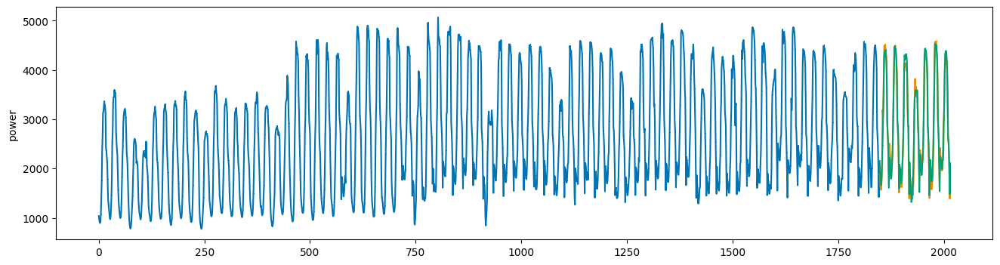

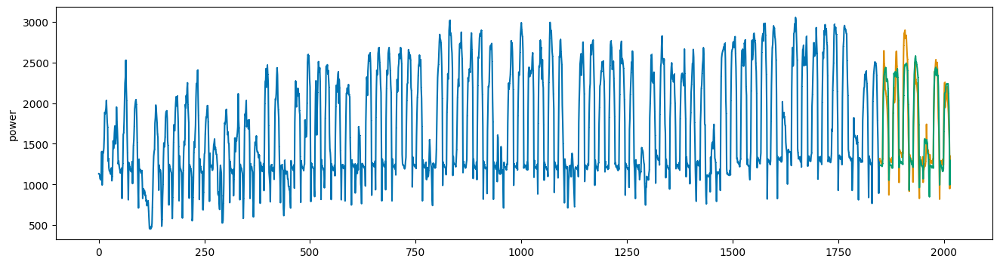

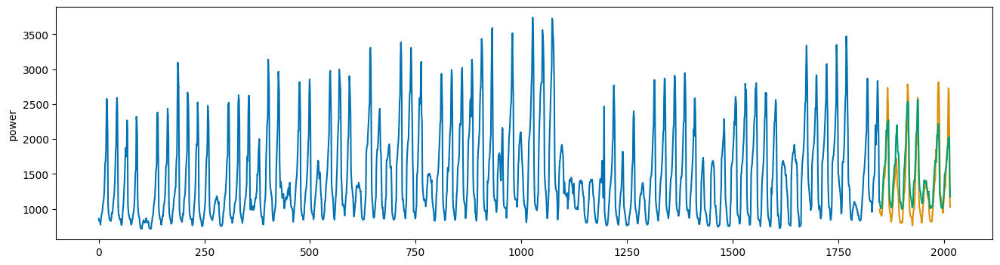

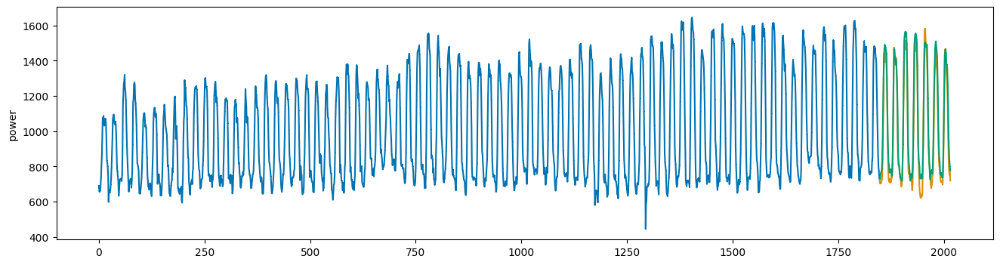

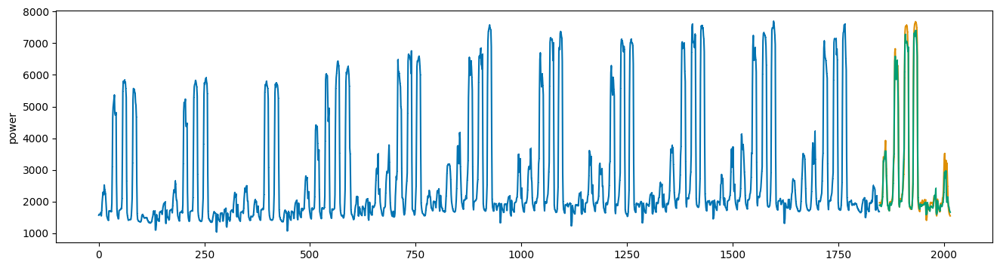

...

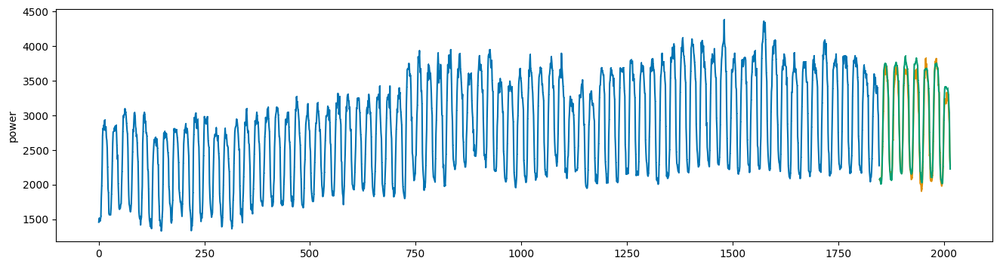

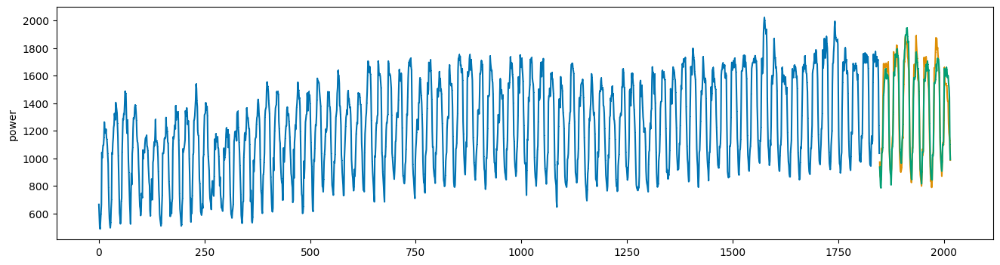

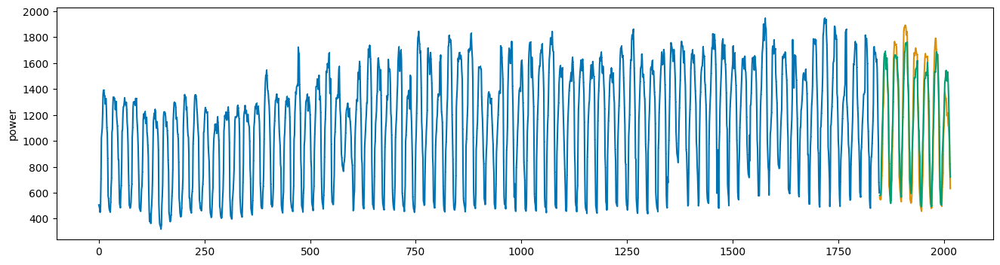

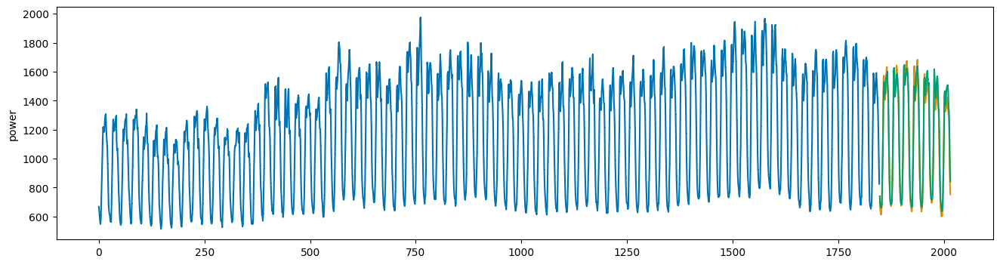

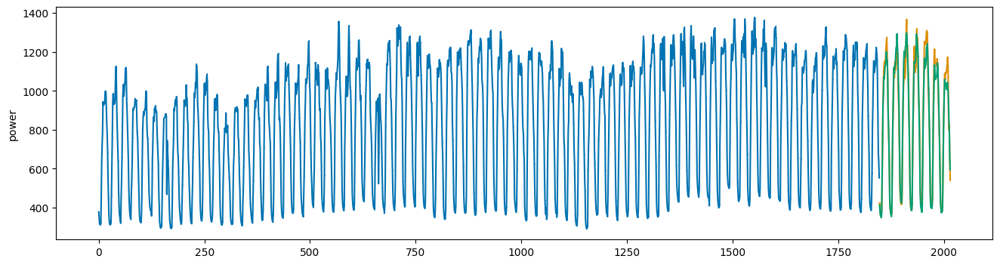

In [ ]:
# LGBM 모델 사용
model_list = []
test_x_list = []
x_valid_list = []
y_valid_list = []

lgbm_preds = np.array([])
smape_score = []
for train_df, test_df in zip(train_list, test_list):
    model = LGBMRegressor(random_state=SEED, objective='regression', force_row_wise=True)
    train_x, train_y, test_x = make_dataset(eval(train_df), eval(test_df))
    x_train, y_train, x_valid, y_valid = train_test_split(train_x, train_y)

    model_list.append(model)
    test_x_list.append(test_x)
    x_valid_list.append(x_valid)
    y_valid_list.append(y_valid)

    score = lgbm_predict(model, x_train, y_train, x_valid, y_valid)
    smape_score.append(score)

    lgbm_pred = lgbm_test_predict(model, train_x, train_y, test_x)
    lgbm_preds = np.concatenate([lgbm_preds, lgbm_pred])

print(smape_score)

# 피쳐 중요도 확인

In [ ]:
train_df_list = [train_df_1,train_df_2,train_df_3,train_df_4,train_df_5,train_df_6,train_df_7,train_df_8,train_df_9,train_df_10,train_df_11,train_df_12,train_df_13,train_df_14,train_df_15,train_df_16,train_df_17,train_df_18,train_df_19,train_df_20,train_df_21,train_df_22,train_df_23,train_df_24,train_df_25,train_df_26,train_df_27,train_df_28,train_df_29,train_df_30,train_df_31,train_df_32,train_df_33,train_df_34,train_df_35,train_df_36,train_df_37,train_df_38,train_df_39,train_df_40,train_df_41,train_df_42,train_df_43,train_df_44,train_df_45,train_df_46,train_df_47,train_df_48,train_df_49,train_df_50,train_df_51,train_df_52,train_df_53,train_df_54,train_df_55,train_df_56,train_df_57,train_df_58,train_df_59,train_df_60,train_df_61,train_df_62,train_df_63,train_df_64,train_df_65,train_df_66,train_df_67,train_df_68,train_df_69,train_df_70,train_df_71,train_df_72,train_df_73,train_df_74,train_df_75,train_df_76,train_df_77,train_df_78,train_df_79,train_df_80,train_df_81,train_df_82,train_df_83,train_df_84,train_df_85,train_df_86,train_df_87,train_df_88,train_df_89,train_df_90,train_df_91,train_df_92,train_df_93,train_df_94,train_df_95,train_df_96,train_df_97,train_df_98,train_df_99,train_df_100]

Explained as: feature importances

Feature importances, computed as a decrease in score when feature
values are permuted (i.e. become noise). This is also known as 
permutation importance.

If feature importances are computed on the same data as used for training, 
they don't reflect importance of features for generalization. Use a held-out
dataset if you want generalization feature importances.

1.2513 ± 0.1194  day_hour_mean
0.1047 ± 0.0151  THI
0.0492 ± 0.0112  temp_EMA
0.0313 ± 0.0056  sin_time
0.0181 ± 0.0033  avg_power_change_rate_7d
0.0158 ± 0.0044  hum_EMA
0.0119 ± 0.0052  day
0.0117 ± 0.0029  temp_2
0.0102 ± 0.0036  hum_RM
0.0083 ± 0.0011  cos_time
0.0062 ± 0.0015  wind_RM
0.0061 ± 0.0005  wind_EMA
0.0035 ± 0.0010  temp_RM
0.0032 ± 0.0006  avg_power_change_rate_24h
0.0018 ± 0.0006  feels_temp
0.0009 ± 0.0007  week
0.0005 ± 0.0006  weekend
     0 ± 0.0000  month


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


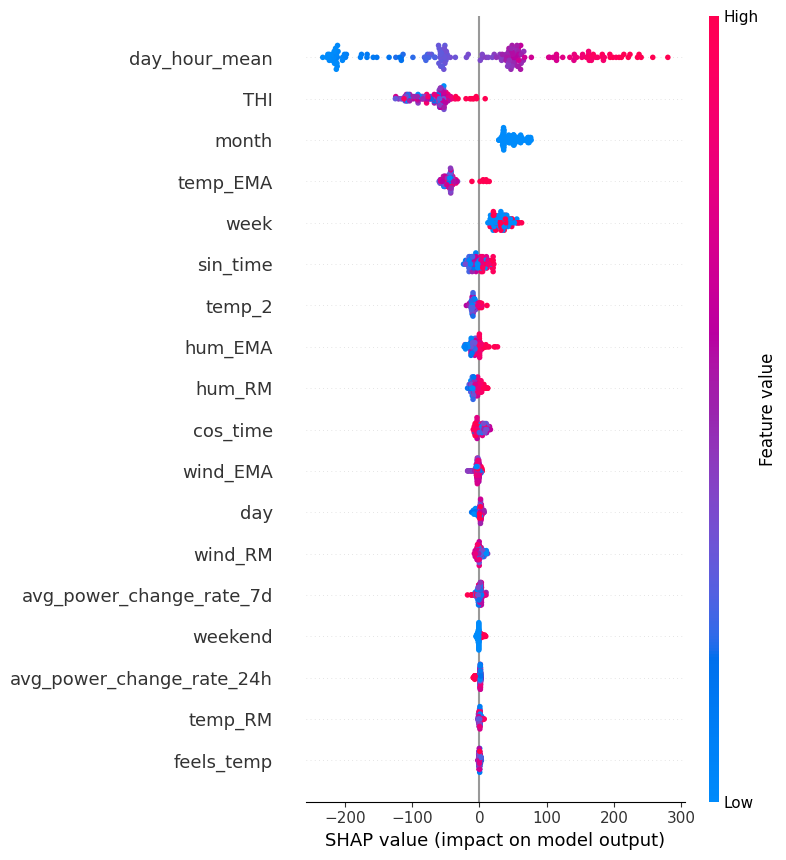

[Text(0.5, 1.0, 'Feature Importance (gain)'),
 Text(0.5, 0, 'Feature Importance'),
 Text(0, 0.5, 'Features')]

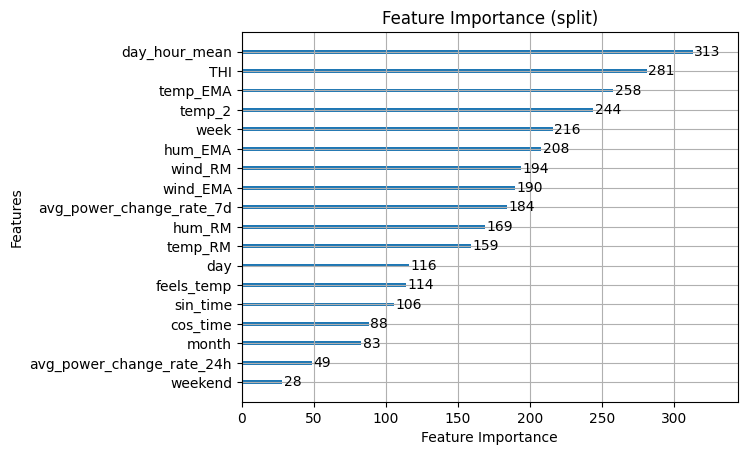

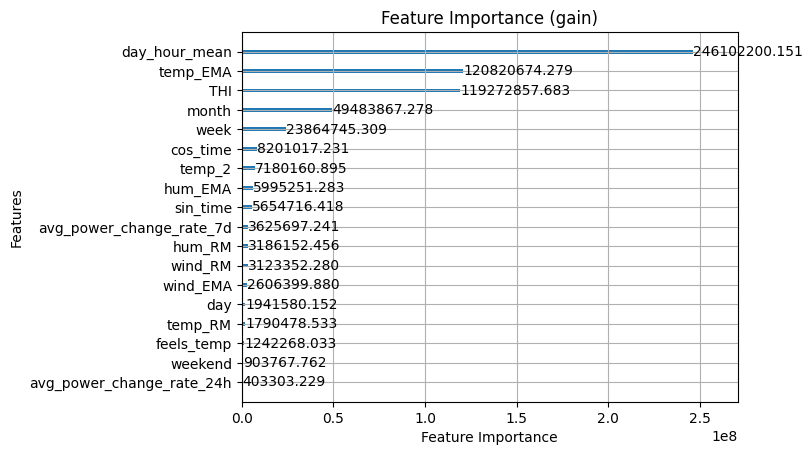

In [ ]:
# 보고싶은 building_num 입력하기
building_num = 65
num = building_num - 1

# for df in train_df_list:
features = train_df_list[num].columns[2:].tolist()
pretrained_model = model_list[num]
X_valid = x_valid_list[num]
Y_valid = y_valid_list[num]
test_X = test_x_list[num]

# Permutation Importance
perm = PermutationImportance(pretrained_model, random_state=42).fit(X_valid, Y_valid)
print(eli5.format_as_text(explain_weights.explain_permutation_importance(perm, feature_names = features, top=20)))

# SHAP (shapely value)
shap.initjs()
explainer = shap.TreeExplainer(pretrained_model)
shap_values = explainer.shap_values(test_X)
fig = shap.summary_plot(shap_values, test_X)

# SPLIT
ax = lgb.plot_importance(pretrained_model, max_num_features=len(features), importance_type='split')
ax.set(title=f'Feature Importance (split)',
    xlabel='Feature Importance',
    ylabel='Features')

# GAIN
ax = lgb.plot_importance(pretrained_model, max_num_features=len(features), importance_type='gain')
ax.set(title=f'Feature Importance (gain)',
    xlabel='Feature Importance',
    ylabel='Features')

## 피쳐 드랍

In [ ]:
# 69
# selected_cols = ['day_hour_mean','THI','weekend','temp_2','temp_EMA','week','cos_time','hum_RM','avg_power_change_rate_7d','hum_EMA']  # 남겨둘 피쳐
# drop_cols = train_df_69.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_69 = train_df_69.drop(columns=drop_cols)
# test_df_69 = test_df_69.drop(columns=drop_cols)

# 70
# selected_cols = ['day_hour_mean','weekend','cos_time','avg_power_change_rate_7d','temp_2']  # 남겨둘 피쳐
# selected_cols = ['day_hour_mean','week','month','weekend','THI','temp_2','cos_time','temp_EMA']
# selected_cols = ['day_hour_mean','week','month','weekend','cos_time','avg_power_change_rate_7d','min_temperature']
# selected_cols = ['day_hour_mean','THI','temp_2','temp_EMA','hum_EMA']
# selected_cols = ['weekend','cos_time','temp_RM','week_sunshine']
selected_cols = ['day_hour_mean','week','month','weekend','cos_time']
drop_cols = train_df_70.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_70 = train_df_70.drop(columns=drop_cols)
test_df_70 = test_df_70.drop(columns=drop_cols)

# 71
# selected_cols = ['day_hour_mean','weekend','THI','week','avg_power_change_rate_7d','day','temp_2','hum_EMA','wind_EMA','feels_temp']  # 남겨둘 피쳐
# drop_cols = train_df_71.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_71 = train_df_71.drop(columns=drop_cols)
# test_df_71 = test_df_71.drop(columns=drop_cols)

# 72
# selected_cols = ['day_hour_mean','weekend','week','THI','temp_2','cos_time','hum_RM','wind_EMA','avg_power_change_rate_7d','day','wind_RM','temp_EMA']  # 남겨둘 피쳐
# selected_cols = ['day_hour_mean','week','month','THI','weekend','temp_2','temp_EMA','cos_time','hum_RM','wind_RM','wind_EMA']
# selected_cols = ['day_hour_mean','week','THI','weekend','temp_2','temp_EMA','cos_time','min_temperature']
# selected_cols = ['day_hour_mean','THI','temp_EMA','temp_2','avg_power_change_rate_7d','hum_RM','working_hour']
# selected_cols = ['day_hour_mean','week','month','THI','weekend','temp_2','temp_EMA','cos_time']
selected_cols = ['month','weekend','cos_time','week_sunshine']
drop_cols = train_df_72.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_72 = train_df_72.drop(columns=drop_cols)
test_df_72 = test_df_72.drop(columns=drop_cols)

# 73
selected_cols = ['day_hour_mean','THI','weekend','temp_2','week','wind_RM','hum_RM','wind_EMA','day','cos_time']  # 남겨둘 피쳐
drop_cols = train_df_73.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_73 = train_df_73.drop(columns=drop_cols)
test_df_73 = test_df_73.drop(columns=drop_cols)

# 74
# selected_cols = ['day_hour_mean','weekend','avg_power_change_rate_7d','avg_power_change_rate_24h','THI','sin_time','hum_EMA','temp_2','temp_2','wind_EMA']  # 남겨둘 피쳐
# selected_cols = ['day_hour_mean','weekend','week','temp_EMA','THI','avg_power_change_rate_24h','temp_2','sin_time']
# selected_cols = ['day_hour_mean','weekend','avg_power_change_rate_24h','sin_time','min_temperature']
# selected_cols = ['day_hour_mean','THI','min_temperature','avg_power_change_rate_24h','sin_time']
# selected_cols = ['day_hour_mean','weekend','week','avg_power_change_rate_24h','sin_time']
selected_cols = ['weekend','cos_time','month','day']
drop_cols = train_df_74.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_74 = train_df_74.drop(columns=drop_cols)
test_df_74 = test_df_74.drop(columns=drop_cols)

# 75
selected_cols = ['day_hour_mean','THI','temp_2','avg_power_change_rate_7d','wind_RM','week','day','feels_temp','wind_EMA','temp_EMA']  # 남겨둘 피쳐
drop_cols = train_df_75.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_75 = train_df_75.drop(columns=drop_cols)
test_df_75 = test_df_75.drop(columns=drop_cols)

# 76
selected_cols = ['day_hour_mean','weekend','avg_power_change_rate_7d','THI','wind_EMA','temp_2','hum_RM','wind_RM','week','cos_time']  # 남겨둘 피쳐
drop_cols = train_df_76.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_76 = train_df_76.drop(columns=drop_cols)
test_df_76 = test_df_76.drop(columns=drop_cols)

# 77
# selected_cols = ['day_hour_mean','weekend','cos_time','temp_2','sin_time','day','feels_temp','THI','temp_EMA','wind_RM']  # 남겨둘 피쳐
# drop_cols = train_df_77.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_77 = train_df_77.drop(columns=drop_cols)
# test_df_77 = test_df_77.drop(columns=drop_cols)

# 78
# selected_cols = ['day_hour_mean','weekend','cos_time','sin_time','THI','temp_2','avg_power_change_rate_7d','temp_EMA','hum_EMA','week']  # 남겨둘 피쳐
# drop_cols = train_df_78.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_78 = train_df_78.drop(columns=drop_cols)
# test_df_78 = test_df_78.drop(columns=drop_cols)

# 79
# selected_cols = ['day_hour_mean','weekend','cos_time','sin_time','THI','feels_temp','day','temp_2','temp_EMA','week']  # 남겨둘 피쳐
# drop_cols = train_df_79.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_79 = train_df_79.drop(columns=drop_cols)
# test_df_79 = test_df_79.drop(columns=drop_cols)

# 80
# selected_cols = ['day_hour_mean','weekend','week','cos_time','temp_EMA','THI','temp_2','sin_time','avg_power_change_rate_7d']
# selected_cols = ['day_hour_mean','weekend','week','cos_time','sin_time','avg_power_change_rate_7d']
# selected_cols = ['day_hour_mean','weekend','cos_time','week','min_temperature']
# selected_cols = ['day_hour_mean','min_temperature']
# selected_cols = ['day_hour_mean','weekend','cos_time']  # 남겨둘 피쳐
selected_cols = ['weekend','cos_time','sin_time','month']
drop_cols = train_df_80.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_80 = train_df_80.drop(columns=drop_cols)
test_df_80 = test_df_80.drop(columns=drop_cols)

# 81
# selected_cols = ['day_hour_mean','cos_time','THI','temp_2','avg_power_change_rate_7d','week','temp_EMA','hum_RM','hum_EMA','wind_EMA']  # 남겨둘 피쳐
# drop_cols = train_df_81.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_81 = train_df_81.drop(columns=drop_cols)
# test_df_81 = test_df_81.drop(columns=drop_cols)

# 82
# selected_cols = ['day_hour_mean','weekend','cos_time','wind_RM','avg_power_change_rate_7d','THI','temp_2']  # 남겨둘 피쳐
# selected_cols = ['day_hour_mean','week','cos_time','THI','temp_2','weekend','wind_RM','temp_EMA']
# selected_cols = ['day_hour_mean','week','cos_time','weekend','min_temperature']
# selected_cols = ['day_hour_mean','min_temperature','temp_2','THI']
# selected_cols = ['cos_time','weekend','wind_RM']
selected_cols = ['day_hour_mean','week','cos_time','weekend']
drop_cols = train_df_82.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_82 = train_df_82.drop(columns=drop_cols)
test_df_82 = test_df_82.drop(columns=drop_cols)

# 83
selected_cols = ['day_hour_mean','weekend','cos_time','temp_EMA']  # 남겨둘 피쳐
drop_cols = train_df_83.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_83 = train_df_83.drop(columns=drop_cols)
test_df_83 = test_df_83.drop(columns=drop_cols)

# 84
# selected_cols = ['day_hour_mean','weekend','cos_time','temp_2','avg_power_change_rate_7d','THI','sin_time','temp_EMA','wind_RM','hum_RM']  # 남겨둘 피쳐
# drop_cols = train_df_84.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_84 = train_df_84.drop(columns=drop_cols)
# test_df_84 = test_df_84.drop(columns=drop_cols)

# 85
selected_cols = ['day_hour_mean','cos_time','temp_2','THI','hum_EMA','sin_time','hum_RM','wind_EMA','temp_EMA','week']  # 남겨둘 피쳐
drop_cols = train_df_85.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_85 = train_df_85.drop(columns=drop_cols)
test_df_85 = test_df_85.drop(columns=drop_cols)

# 86
# selected_cols = []  # 남겨둘 피쳐
# drop_cols = train_df_86.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_86 = train_df_86.drop(columns=drop_cols)
# test_df_86 = test_df_86.drop(columns=drop_cols)

# 87
# selected_cols = ['day_hour_mean','avg_power_change_rate_7d','THI','wind_EMA','avg_power_change_rate_24h','temp_2','cos_time','hum_EMA','wind_RM','feels_temp','day']  # 남겨둘 피쳐
# selected_cols = ['day_hour_mean','week','weekend','avg_power_change_rate_24h','month','cos_time','day']
# selected_cols = ['day_hour_mean','week','weekend','avg_power_change_rate_24h','temp_2','THI','temp_EMA','month','cos_time','wind_EMA','hum_EMA','day']
# selected_cols = ['day_hour_mean','avg_power_change_rate_24h','temp_2','hum_EMA','day']
# selected_cols = ['weekend','month','cos_time','wind_EMA']
selected_cols = ['day_hour_mean','week','weekend','avg_power_change_rate_24h','temp_2','cos_time','wind_EMA','hum_EMA','min_temperature']
drop_cols = train_df_87.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_87 = train_df_87.drop(columns=drop_cols)
test_df_87 = test_df_87.drop(columns=drop_cols)

# 88
# selected_cols = []  # 남겨둘 피쳐
# drop_cols = train_df_88.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_88 = train_df_88.drop(columns=drop_cols)
# test_df_88 = test_df_88.drop(columns=drop_cols)

# 89
# selected_cols = []  # 남겨둘 피쳐
# drop_cols = train_df_89.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_89 = train_df_89.drop(columns=drop_cols)
# test_df_89 = test_df_89.drop(columns=drop_cols)

# 90
# selected_cols = []  # 남겨둘 피쳐
# drop_cols = train_df_90.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_90 = train_df_90.drop(columns=drop_cols)
# test_df_90 = test_df_90.drop(columns=drop_cols)

# 91
# selected_cols = ['day_hour_mean','day','week','temp_2','wind_RM']  # 남겨둘 피쳐
# selected_cols = ['day_hour_mean','weekend','week','day']
# selected_cols = ['day_hour_mean','weekend','week','temp_2','THI','day','hum_EMA','hum_RM','wind_RM']
# selected_cols = ['day_hour_mean','min_temperature','temp_2','day','hum_RM','THI','hum_EMA']
# selected_cols = ['weekend','month']
selected_cols = ['day_hour_mean','weekend','week','temp_2','THI','day','hum_EMA','hum_RM','wind_RM','min_temperature']
drop_cols = train_df_91.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_91 = train_df_91.drop(columns=drop_cols)
test_df_91 = test_df_91.drop(columns=drop_cols)

# 92
# selected_cols = ['day_hour_mean','sin_time','cos_time','avg_power_change_rate_7d','temp_2','THI','hum_RM']  # 남겨둘 피쳐
selected_cols = ['day_hour_mean','weekend','cos_time','week','sin_time','THI','hum_RM','hum_EMA']
drop_cols = train_df_92.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_92 = train_df_92.drop(columns=drop_cols)
test_df_92 = test_df_92.drop(columns=drop_cols)

# 93
# selected_cols = ['day_hour_mean','week','wind_EMA','hum_RM','cos_time','temp_2','day','THI','hum_EMA','temp_EMA']  # 남겨둘 피쳐
# drop_cols = train_df_93.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_93 = train_df_93.drop(columns=drop_cols)
# test_df_93 = test_df_93.drop(columns=drop_cols)

# 94
# selected_cols = ['day_hour_mean','temp_2','THI','day','hum_RM','cos_time','temp_EMA','min_temperature']
# selected_cols = ['day_hour_mean','temp_2','min_temperature','temp_EMA','hum_RM','day','hum_EMA']
# selected_cols = ['month','cos_time','week_sunshine']
selected_cols = ['day_hour_mean','temp_2','THI','hum_EMA','day','wind_RM','hum_RM','cos_time','week','temp_EMA']  # 남겨둘 피쳐
drop_cols = train_df_94.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_94 = train_df_94.drop(columns=drop_cols)
test_df_94 = test_df_94.drop(columns=drop_cols)

# 95
# selected_cols = ['day_hour_mean','avg_power_change_rate_7d','temp_2','THI','hum_RM','wind_EMA','week','hum_EMA','wind_RM','day','temp_EMA','temp_RM','sin_time','feels_temp','avg_power_change_rate_24h','cos_time']  # 남겨둘 피쳐
# selected_cols = ['day_hour_mean','week','avg_power_change_rate_7d','month']
# selected_cols = ['day_hour_mean','temp_2','THI','week','avg_power_change_rate_7d','hum_RM','wind_EMA','temp_EMA','min_temperature']
# selected_cols = ['day_hour_mean','temp_2','THI','avg_power_change_rate_7d','hum_RM','wind_EMA']
# selected_cols = ['min_temperature','month','week','wind_RM','week_sunshine']
selected_cols = ['day_hour_mean','temp_2','THI','week','avg_power_change_rate_7d','hum_RM','wind_EMA','month','hum_EMA','temp_EMA']
drop_cols = train_df_95.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_95 = train_df_95.drop(columns=drop_cols)
test_df_95 = test_df_95.drop(columns=drop_cols)

# 96
# selected_cols = ['day_hour_mean','temp_2','temp_EMA','hum_EMA','day','THI','hum_RM','avg_power_change_rate_24h','wind_RM','wind_EMA']  # 남겨둘 피쳐
# drop_cols = train_df_96.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_96 = train_df_96.drop(columns=drop_cols)
# test_df_96 = test_df_96.drop(columns=drop_cols)

# 97
# selected_cols = ['day_hour_mean','temp_2','hum_EMA','temp_EMA','avg_power_change_rate_7d','wind_RM','THI','hum_RM','day','wind_EMA']  # 남겨둘 피쳐
# drop_cols = train_df_97.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_97 = train_df_97.drop(columns=drop_cols)
# test_df_97 = test_df_97.drop(columns=drop_cols)

# 98
# selected_cols = ['day_hour_mean','temp_2','THI','wind_RM','avg_power_change_rate_7d','hum_EMA','temp_EMA','day']  # 남겨둘 피쳐
# selected_cols = ['day_hour_mean','week','month','avg_power_change_rate_7d']
# selected_cols = ['day_hour_mean','temp_2','week','THI','month','hum_EMA','hum_RM','avg_power_change_rate_7d']
# selected_cols = ['day_hour_mean','temp_2','min_temperature','hum_EMA','hum_RM','avg_power_change_rate_7d']
# selected_cols = ['week','month','wind_RM','cos_time']
selected_cols = ['day_hour_mean','temp_2','week','THI','hum_EMA','hum_RM','min_temperature']
drop_cols = train_df_98.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_98 = train_df_98.drop(columns=drop_cols)
test_df_98 = test_df_98.drop(columns=drop_cols)

# 99
selected_cols = ['day_hour_mean','temp_2','THI','temp_EMA','week','hum_RM','wind_EMA','hum_EMA','wind_RM','day']  # 남겨둘 피쳐
drop_cols = train_df_99.columns[2:].tolist()
drop_cols = [col for col in drop_cols if col not in selected_cols]
train_df_99 = train_df_99.drop(columns=drop_cols)
test_df_99 = test_df_99.drop(columns=drop_cols)

# 100
# selected_cols = ['day_hour_mean','temp_2','THI','cos_time','wind_EMA','wind_RM','week','feels_temp','temp_RM','hum_RM']  # 남겨둘 피쳐
# drop_cols = train_df_100.columns[2:].tolist()
# drop_cols = [col for col in drop_cols if col not in selected_cols]
# train_df_100 = train_df_100.drop(columns=drop_cols)
# test_df_100 = test_df_100.drop(columns=drop_cols)

# 건물별 예측(2차, 4 Fold)

In [ ]:
# LGBM 모델 사용
lgbm_preds = np.array([])
fold = 4
smape_score_mean = []
for train_df, test_df in zip(train_list, test_list):
    model = LGBMRegressor(random_state=SEED, objective='regression')
    train_x, train_y, test_x = make_dataset(eval(train_df), eval(test_df))
    # 건물별 fold별 smape score
    smape_score = []
    for n in range(fold):
        x_train, y_train, x_valid, y_valid = n_fold_train_test_split(train_x, train_y, n=n)
        model.fit(x_train, y_train, eval_set=[(x_valid, y_valid)], callbacks = [early_stopping(300)], eval_metric=lightgbm_smape)
        pred = model.predict(x_valid)
        score = _smape(y_valid, pred)
        smape_score.append(score)
    smape_score_mean.append(np.mean(smape_score))

    lgbm_pred = lgbm_test_predict(model, train_x, train_y, test_x)
    lgbm_preds = np.concatenate([lgbm_preds, lgbm_pred])

print(smape_score_mean)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2629
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 18
[LightGBM] [Info] Start training from score 2645.323115
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[55]	valid_0's l2: 29260.5	valid_0's SMAPE: 5.32329
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2631
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 18
[LightGBM] [Info] Start training from score 2643.755583
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[26]	valid_0's l2: 27763	valid_0's

In [ ]:
lgbm_preds.shape

(16800,)

In [ ]:
# XGBoost 모델 사용
xgb_preds = np.array([])
fold = 4
smape_score_mean = []
for train_df, test_df in tqdm(zip(train_list, test_list), total=100):
    model = XGBRegressor(random_state=SEED, n_jobs=-1, verbosity=0)
    train_x, train_y, test_x = make_dataset(eval(train_df), eval(test_df))
    # 건물별 fold별 smape score
    smape_score = []
    for n in tqdm(range(fold)):
        x_train, y_train, x_valid, y_valid = n_fold_train_test_split(train_x, train_y, n=n)

        model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], early_stopping_rounds=60, eval_metric=xgb_smape)

        pred = model.predict(x_valid)
        score = _smape(y_valid, pred)
        smape_score.append(score)

    smape_score_mean.append(np.mean(smape_score))

    xgb_pred = xgb_test_predict(model, train_x, train_y, test_x)
    xgb_preds = np.concatenate([xgb_preds, xgb_pred])

print(smape_score_mean)

In [ ]:
np.mean(smape_score_mean)

6.703185325823889

In [ ]:
xgb_preds.shape

(16800,)

## Auto ML

In [ ]:
from flaml import AutoML

auto_preds = np.array([])
for train_df, test_df in tqdm(zip(train_list[68:], test_list[68:]), total=32):
    train_x, train_y, test_x = make_dataset(eval(train_df), eval(test_df))
    model = AutoML()
    params = {
    "metric": "mape",
    "task": "regression",
    "time_budget": 60,
    "seed": SEED,
    "early_stop": True,
    "estimator_list" : ['lgbm', 'xgboost']
    }

    model.fit(train_x, train_y,**params)
    auto_pred = model.predict(test_x)
    auto_preds = np.concatenate([auto_preds, auto_pred])

  0%|          | 0/32 [00:00<?, ?it/s]

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
[flaml.automl.logger: 08-27 12:57:34] {2218} INFO - iteration 119, current learner lgbm
[flaml.automl.logger: 08-27 12:57:34] {2391} INFO -  at 22.8s,	estimator lgbm's best error=0.0638,	best estimator lgbm's best error=0.0638
[flaml.automl.logger: 08-27 12:57:34] {2218} INFO - iteration 120, current learner lgbm
[flaml.automl.logger: 08-27 12:57:35] {2391} INFO -  at 22.9s,	estimator lgbm's best error=0.0638,	best estimator lgbm's best error=0.0638
[flaml.automl.logger: 08-27 12:57:35] {2218} INFO - iteration 121, current learner lgbm
[flaml.automl.logger: 08-27 12:57:35] {2391} INFO -  at 23.1s,	estimator lgbm's best error=0.0638,	best estimator lgbm's best error=0.0638
[flaml.automl.logger: 08-27 12:57:35] {2218} INFO - iteration 122, current learner lgbm
[flaml.automl.logger: 08-27 12:57:39] {2391} INFO -  at 27.2s,	estimator lgbm's best error=0.0638,	best estimator lgbm's best error=0.0638
[flaml.automl.logger: 08-27 12:57:39] {2218} INFO - iter

## 예측값 저장(Auto ML)

In [ ]:
submission = pd.read_csv(f"{DATA_PATH}sample_submission.csv")

In [ ]:
submission.shape

(16800, 2)

In [ ]:
submission.iloc[11424 : , 1] = auto_preds

In [ ]:
submission.iloc[11424 :]

,num_date_time,answer
11424,69_20220825 00,3555.206276
11425,69_20220825 01,3534.118321
11426,69_20220825 02,3498.986672
11427,69_20220825 03,3489.154935
11428,69_20220825 04,3485.455807
...,...,...
16795,100_20220831 19,877.597734
16796,100_20220831 20,795.162524
16797,100_20220831 21,725.340849
16798,100_20220831 22,629.704178


In [ ]:
submission.isnull().sum()

num_date_time    0
answer           0
dtype: int64

In [ ]:
submission.to_csv(f"{DATA_PATH}Aml_submission_69_100_nsw.csv", index=False)

In [ ]:
def quantile(x):
    quantiles = train_ft["temp_2"].quantile([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9])
    q10 = quantiles[0.1]
    if x < q10:
        return 0
    elif x < quantiles[0.2]:
        return 1
    elif x < quantiles[0.3]:
        return 2
    elif x < quantiles[0.4]:
        return 3
    elif x < quantiles[0.5]:
        return 4
    elif x < quantiles[0.6]:
        return 5
    elif x < quantiles[0.7]:
        return 6
    elif x < quantiles[0.8]:
        return 7
    elif x < quantiles[0.9]:
        return 8
    else:
        return 9

train_ft["temp_2"] = train["temp_2"].apply(quantile).astype(str)

## 예측값 저장(LGBM, XGB)

In [ ]:
submission = pd.read_csv(f"{DATA_PATH}sample_submission.csv")

In [ ]:
submission.shape

(16800, 2)

In [ ]:
submission['answer']= lgbm_preds

In [ ]:
lgbm_preds[11424 :]

array([3593.01932459, 3496.06842127, 3477.10362822, ...,  756.86166778,
        624.83891759,  551.10683818])

In [ ]:
submission.iloc[11424 : , 1]

11424    3593.019325
11425    3496.068421
11426    3477.103628
11427    3522.251763
11428    3522.006394
            ...     
16795     913.268321
16796     818.142510
16797     756.861668
16798     624.838918
16799     551.106838
Name: answer, Length: 5376, dtype: float64

In [ ]:
submission.isnull().sum()

num_date_time    0
answer           0
dtype: int64

In [ ]:
submission.to_csv(f"{DATA_PATH}LGBM_submission_69_100_nsw.csv", index=False)

In [ ]:
# submission['answer'] = xgb_preds

In [ ]:
# submission.to_csv(f"{DATA_PATH}XGB_submission_ver6_nsw.csv", index=False)

- TWH 관련 피쳐와 전력 관련 피쳐 앙상블

In [ ]:
# ver5_22 = pd.read_csv(f"{DATA_PATH}XGB_submission_ver5_22_nsw.csv")
# ver5_23 = pd.read_csv(f"{DATA_PATH}XGB_submission_ver5_23_nsw.csv")

In [ ]:
# (ver5_22 + ver5_23)/2

In [ ]:
# submission['answer'] = (ver5_22 + ver5_23)/2

In [ ]:
# submission.isnull().sum()

In [ ]:
# submission.to_csv(f"{DATA_PATH}XGB_submission_ver5_ensemble_nsw.csv", index=False)